# TWISST Analysis of *Relate* trees
AvePla-n74

In [42]:
library(foreach)
library(tidyverse)
# library()
library(data.table)
library(tictoc)
library(patchwork)
source('~/twisst/plot_twisst.R')
setwd('~/snap_hap_repHZ/twisst/trees_relate/')

In [43]:
## Functions

# -----
prepareData <- function(chrom, weights, treePos, SnpPos) {
    # Read files
    wt <- fread(weights, header = TRUE)
    treePos <- fread(treePos)
    SnpPos <- fread(SnpPos, col.names = c('chrom', 'pos'))
  
    # Create new columns
    wt[, ':='(
        start = treePos$V1,
        end = data.table::shift(treePos$V1, type = 'lead') - 1,
        total = topo1 + topo2 + topo3,
        wt1 = topo1 / (topo1 + topo2 + topo3),
        wt2 = topo2 / (topo1 + topo2 + topo3),
        wt3 = topo3 / (topo1 + topo2 + topo3)
    )]
    
    # Fix last position
    wt[nrow(wt), end := SnpPos[.N, pos]]
    
    # Calculate mid
    wt[, mid := (start + end) / 2]
    
    # Calculate sites
    setkey(wt, start, end)
    wt[, sites := SnpPos[wt, .N, by = .EACHI, on = .(pos >= start, pos <= end)]$N]
    wt[, chrom := rep(chrom, nrow(wt))]
    
    
    return(wt)
}

# -----
plotTopoWt12 = function(chromData, mainLabel, transparency){
    plot(wt1~start, chromData, type='l', col=alpha('sienna1', transparency), #ylim=c(0.2,0.8),
         main=mainLabel,ylab='Topology Weights',xlab='Position', lwd=0.5)
    lines(wt2~start, chromData, col=alpha('blue',transparency), lwd=0.5)
    }

# -----
loess.smooth.weights = function(pos, topoWeights, sites, span, family){
    y.loess <- loess(topoWeights ~ pos, span = span, weights = sites, family=family)
    y.predict <- predict(y.loess, pos)
}

# -----
rescale.weights = function(dt, cols_to_rescale){
    # Ensure dt is a data.table
    setDT(dt)
    
    # Calculate row sums and rescale
    dt[, (cols_to_rescale) := lapply(.SD, function(x) x / sum(x)), .SDcols = cols_to_rescale, by = seq_len(nrow(dt))]
  
    return(dt)
}

## Read data

In [45]:
## Read smoothed weights
chr1 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr1.weights.smooth.csv.gz')
chr2 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr2.weights.smooth.csv.gz')
chr3 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr3.weights.smooth.csv.gz')
chr4 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr4.weights.smooth.csv.gz')
chr5 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr5.weights.smooth.csv.gz')
chr6 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr6.weights.smooth.csv.gz')
chr7 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr7.weights.smooth.csv.gz')
chr8 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr8.weights.smooth.csv.gz')

In [10]:
# ## Read raw weights
# chr1 = prepareData('chr1', './weights/chr1.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr1-1-71919034.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr1.AvePla.FrYe.sorted.statphased.vcf.pos.gz')
# chr2 = prepareData('chr2', './weights/chr2.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr2-1-77118269.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr2.AvePla.FrYe.sorted.statphased.vcf.pos.gz')
# chr3 = prepareData('chr3', './weights/chr3.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr3-1-65231163.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr3.AvePla.FrYe.sorted.statphased.vcf.pos.gz')
# chr4 = prepareData('chr4', './weights/chr4.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr4-1-54887108.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr4.AvePla.FrYe.sorted.statphased.vcf.pos.gz')
# chr5 = prepareData('chr5', './weights/chr5.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr5-1-71106538.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr5.AvePla.FrYe.sorted.statphased.vcf.pos.gz')
# chr6 = prepareData('chr6', './weights/chr6.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr6-1-55699338.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr6.AvePla.FrYe.sorted.statphased.vcf.pos.gz')
# chr7 = prepareData('chr7', './weights/chr7.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr7-1-55564713.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr7.AvePla.FrYe.sorted.statphased.vcf.pos.gz')
# chr8 = prepareData('chr8', './weights/chr8.weights.csv.gz', '~/snap_hap_repHZ/relate/newickTrees/rel_chr8-1-57431585.pos', '~/snap_hap_repHZ/statphase/AvePla_FrYe/Chr8.AvePla.FrYe.sorted.statphased.vcf.pos.gz')

In [46]:
nrow(chr1)
nrow(chr2)
nrow(chr3)
nrow(chr4)
nrow(chr5)
nrow(chr6)
nrow(chr7)
nrow(chr8)

[1] 694286

[1] 755313

[1] 601589

[1] 519763

[1] 743650

[1] 550068

[1] 518563

[1] 592222

In [47]:
str(chr1)
str(chr2)
str(chr3)
str(chr4)
str(chr5)
str(chr6)
str(chr7)
str(chr8)

Classes ‘data.table’ and 'data.frame':	694286 obs. of  15 variables:
 $ treeID    : int  1 2 3 4 5 6 7 8 9 10 ...
 $ topo1     : int  3455 3391 3287 3295 3312 3269 3274 3459 3541 3501 ...
 $ topo2     : int  3349 3390 3474 3567 3573 3598 3455 3212 3175 3076 ...
 $ topo3     : int  3196 3219 3239 3138 3115 3133 3271 3329 3284 3423 ...
 $ start     : int  4912 5270 5655 6024 6065 6178 6218 6264 6294 6320 ...
 $ end       : int  5269 5654 6023 6064 6177 6217 6263 6293 6319 6379 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ wt1       : num  0.345 0.339 0.329 0.33 0.331 ...
 $ wt2       : num  0.335 0.339 0.347 0.357 0.357 ...
 $ wt3       : num  0.32 0.322 0.324 0.314 0.311 ...
 $ mid       : num  5090 5462 5839 6044 6121 ...
 $ sites     : int  7 5 1 3 2 1 1 1 1 5 ...
 $ wt1.smooth: num  0.349 0.349 0.349 0.349 0.349 ...
 $ wt2.smooth: num  0.323 0.323 0.323 0.323 0.323 ...
 $ wt3.smooth: num  0.328 0.328 0.328 0.328 0.328 ...
 - attr(*, ".inte

In [48]:
allchrom = rbind(chr1,
                 chr2,
                 chr3,
                 chr4,
                 chr5,
                 chr6,
                 chr7,
                 chr8)
allchrom = allchrom %>% mutate(span = end - start,
                               chrom = c(rep('Chr1', nrow(chr1)), 
                                         rep('Chr2', nrow(chr2)), 
                                         rep('Chr3', nrow(chr3)), 
                                         rep('Chr4', nrow(chr4)), 
                                         rep('Chr5', nrow(chr5)), 
                                         rep('Chr6', nrow(chr6)), 
                                         rep('Chr7', nrow(chr7)), 
                                         rep('Chr8', nrow(chr8))
                                        ))
allchrom = allchrom[, c('chrom', 'start', 'end', 'mid', 'span', 'sites', #'recRate', 
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
allchrom$asymTc55 = ifelse(allchrom$wt2 >= 0.55, 0.8, -1)
allchrom$asymTc60 = ifelse(allchrom$wt2 >= 0.60, 0.7, -1)

str(allchrom)

Classes ‘data.table’ and 'data.frame':	4975454 obs. of  18 variables:
 $ chrom     : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ start     : int  4912 5270 5655 6024 6065 6178 6218 6264 6294 6320 ...
 $ end       : int  5269 5654 6023 6064 6177 6217 6263 6293 6319 6379 ...
 $ mid       : num  5090 5462 5839 6044 6121 ...
 $ span      : int  357 384 368 40 112 39 45 29 25 59 ...
 $ sites     : int  7 5 1 3 2 1 1 1 1 5 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3455 3391 3287 3295 3312 3269 3274 3459 3541 3501 ...
 $ topo2     : int  3349 3390 3474 3567 3573 3598 3455 3212 3175 3076 ...
 $ topo3     : int  3196 3219 3239 3138 3115 3133 3271 3329 3284 3423 ...
 $ wt1       : num  0.345 0.339 0.329 0.33 0.331 ...
 $ wt2       : num  0.335 0.339 0.347 0.357 0.357 ...
 $ wt3       : num  0.32 0.322 0.324 0.314 0.311 ...
 $ wt1.smooth: num  0.349 0.349 0.349 0.349 0.349 ...
 $ wt2.smooth: num  0.323 0.323 0.323 0.323 0.323 ...
 $ wt

In [ ]:
quantile(allchrom$wt1, probs=c(0.5,0.95,0.99))
quantile(allchrom$wt2, probs=c(0.5,0.95,0.99))
quantile(allchrom$wt3, probs=c(0.5,0.95,0.99))

In [7]:
mean(allchrom$wt1)
mean(allchrom$wt2)
mean(allchrom$wt3)

[1] 0.3671637

[1] 0.3170125

[1] 0.3158238

In [9]:
summary(allchrom$wt1)
# max(allchrom$wt2)
# max(allchrom$wt3)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0639  0.3302  0.3507  0.3672  0.3858  0.9297 

In [126]:
mean(allchrom$sites)
sd(allchrom$sites)

[1] 2.317985

[1] 1.628836

In [127]:
mean(allchrom$span)
sd(allchrom$span)

[1] 101.2432

[1] 739.3796

In [124]:
summary(allchrom)

     start               end                mid                span         
 Min.   :     185   Min.   :     869   Min.   :     527   Min.   :     0.0  
 1st Qu.:15505806   1st Qu.:15505922   1st Qu.:15505869   1st Qu.:    21.0  
 Median :34032914   Median :34033024   Median :34032961   Median :    47.0  
 Mean   :33646396   Mean   :33646497   Mean   :33646446   Mean   :   101.2  
 3rd Qu.:50607705   3rd Qu.:50607808   3rd Qu.:50607764   3rd Qu.:    96.0  
 Max.   :77108612   Max.   :77117553   Max.   :77113082   Max.   :416750.0  
     sites            total           topo1          topo2          topo3     
 Min.   : 1.000   Min.   :10000   Min.   : 639   Min.   : 270   Min.   : 367  
 1st Qu.: 1.000   1st Qu.:10000   1st Qu.:3302   1st Qu.:2998   1st Qu.:2990  
 Median : 2.000   Median :10000   Median :3507   Median :3206   Median :3199  
 Mean   : 2.318   Mean   :10000   Mean   :3672   Mean   :3170   Mean   :3158  
 3rd Qu.: 3.000   3rd Qu.:10000   3rd Qu.:3858   3rd Qu.:3380   3r

## Loess Smoothing

### Test Smoothing

In [26]:
span_bp=50000
chromLength=77118269
span_bp/chromLength

[1] 0.0006483548

In [28]:
span_bp=20000
chromLength=77118269
span_bp/chromLength

[1] 0.0002593419

In [29]:
span_bp = 20000
chromLength = 77118269
span = span_bp/chromLength

chr2$wt1.smooth = loess.smooth.weights(chr2$mid, chr2$wt1, chr2$sites, span, "gaussian")
chr2$wt2.smooth = loess.smooth.weights(chr2$mid, chr2$wt2, chr2$sites, span, "gaussian")
chr2$wt3.smooth = loess.smooth.weights(chr2$mid, chr2$wt3, chr2$sites, span, "gaussian")

### Final Smoothing

In [5]:
span_bp = 50000

In [6]:
## Chr1
chromLength = 71919034
span = span_bp/chromLength
dat = chr1
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr1 <- dat

In [7]:
## Chr2
chromLength = 77118269
span = span_bp/chromLength
dat <- chr2
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr2 <- dat

In [8]:
## Chr3
chromLength = 65231163
span = span_bp/chromLength
dat <- chr3
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr3 <- dat

In [9]:
## Chr4
chromLength = 54887108
span = span_bp/chromLength
dat <- chr4
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr4 <- dat

In [10]:
## Chr5
chromLength = 71106538
span = span_bp/chromLength
dat <- chr5
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr5 <- dat

In [11]:
## Chr6
chromLength = 55699338
span = span_bp/chromLength
dat <- chr6
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr6 <- dat

In [12]:
## Chr7
chromLength = 55564713
span = span_bp/chromLength
dat <- chr7
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr7 <- dat

In [13]:
## Chr8
chromLength = 57431585
span = span_bp/chromLength
dat <- chr8
dat$wt1.smooth = loess.smooth.weights(dat$mid, dat$wt1, dat$sites, span, "gaussian")
dat$wt2.smooth = loess.smooth.weights(dat$mid, dat$wt2, dat$sites, span, "gaussian")
dat$wt3.smooth = loess.smooth.weights(dat$mid, dat$wt3, dat$sites, span, "gaussian")
chr8 <- dat

### Save smooth weights

In [15]:
# fwrite(chr1, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr1.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)
# fwrite(chr2, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr2.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)
# fwrite(chr3, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr3.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)
# fwrite(chr4, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr4.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)
# fwrite(chr5, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr5.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)
# fwrite(chr6, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr6.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)
# fwrite(chr7, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr7.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)
# fwrite(chr8, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr8.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [108]:
## Read smoothed weights
chr1 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr1.weights.smooth.csv.gz')
chr2 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr2.weights.smooth.csv.gz')
chr3 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr3.weights.smooth.csv.gz')
chr4 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr4.weights.smooth.csv.gz')
chr5 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr5.weights.smooth.csv.gz')
chr6 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr6.weights.smooth.csv.gz')
chr7 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr7.weights.smooth.csv.gz')
chr8 = fread('~/snap_hap_repHZ/twisst/trees_relate/weights/chr8.weights.smooth.csv.gz')

In [15]:
str(chr2)

Classes ‘data.table’ and 'data.frame':	755313 obs. of  16 variables:
 $ start     : int  3042 3183 3223 3234 3321 6199 6308 6729 6835 6849 ...
 $ end       : int  3182 3222 3233 3320 6198 6307 6728 6834 6848 6962 ...
 $ mid       : num  3112 3202 3228 3277 4760 ...
 $ span      : int  140 39 10 86 2877 108 420 105 13 113 ...
 $ sites     : int  6 2 1 1 1 1 2 2 1 1 ...
 $ recRate   : num  29 34.5 34.6 34.6 34.6 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3253 3319 3250 3112 2956 3331 3360 3587 3475 3510 ...
 $ topo2     : int  3182 3291 3314 3417 3390 3407 3338 3188 3150 3174 ...
 $ topo3     : int  3565 3390 3436 3471 3654 3262 3302 3225 3375 3316 ...
 $ wt1       : num  0.325 0.332 0.325 0.311 0.296 ...
 $ wt2       : num  0.318 0.329 0.331 0.342 0.339 ...
 $ wt3       : num  0.356 0.339 0.344 0.347 0.365 ...
 $ wt1.smooth: num  0.33 0.33 0.33 0.33 0.33 ...
 $ wt2.smooth: num  0.336 0.336 0.336 0.336 0.336 ...
 $ wt3.smoo

## Plots: test

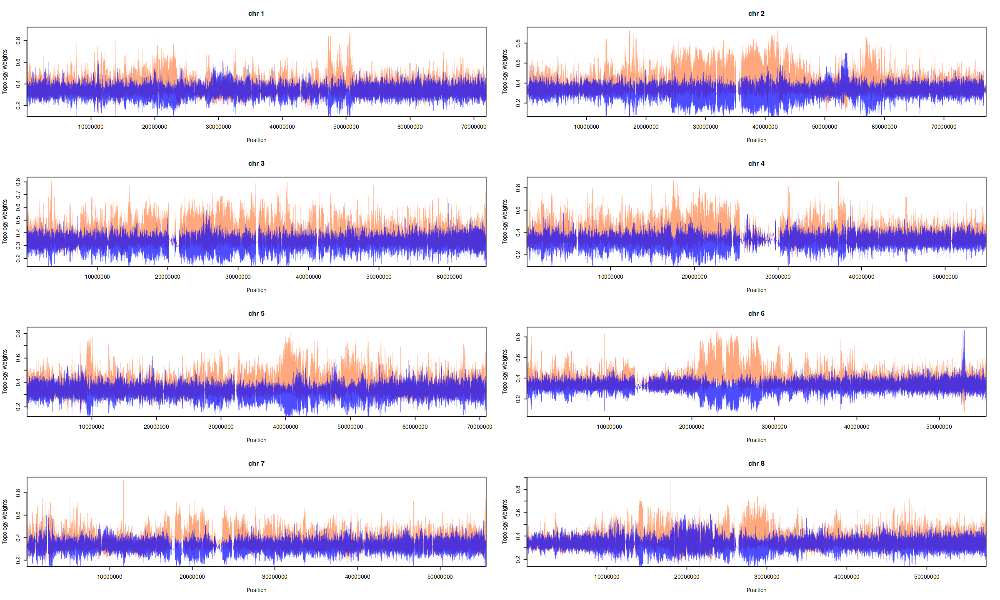

In [5]:
options(repr.plot.width=20, repr.plot.height=12)
par(mfrow=c(4,2), xaxs='i')

plotTopoWt12(chr1, 'chr 1', 0.7)
plotTopoWt12(chr2, 'chr 2', 0.7)
plotTopoWt12(chr3, 'chr 3', 0.7)
plotTopoWt12(chr4, 'chr 4', 0.7)
plotTopoWt12(chr5, 'chr 5', 0.7)
plotTopoWt12(chr6, 'chr 6', 0.7)
plotTopoWt12(chr7, 'chr 7', 0.7)
plotTopoWt12(chr8, 'chr 8', 0.7)

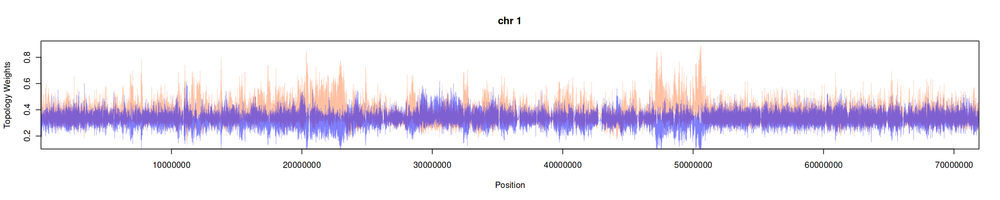

In [6]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr1, 'chr 1', 0.7)

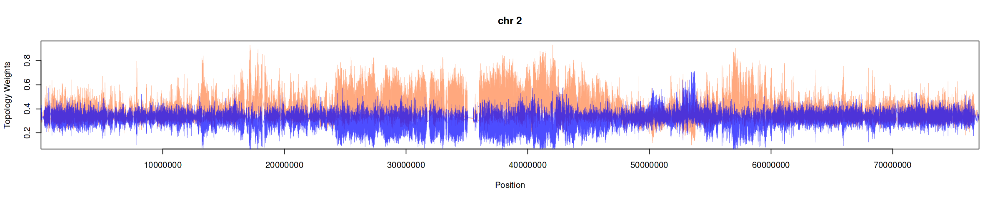

In [10]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr2, 'chr 2', 0.7)

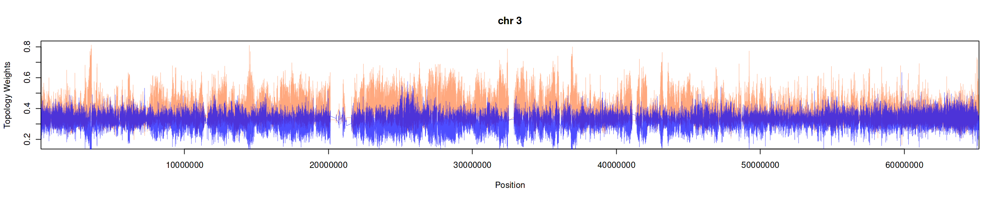

In [11]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr3, 'chr 3', 0.7)

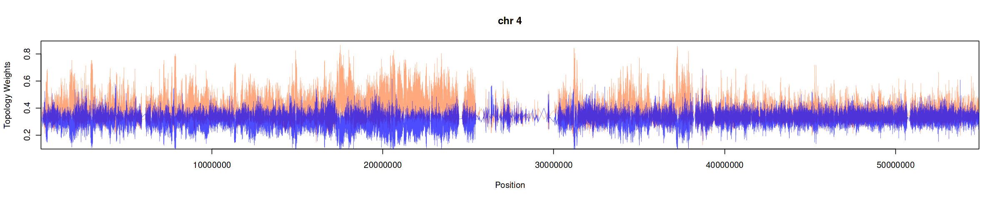

In [12]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr4, 'chr 4', 0.7)

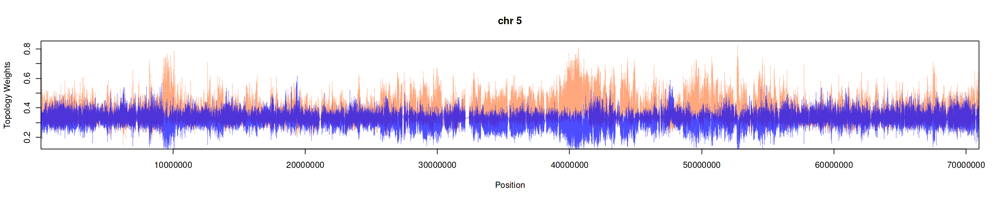

In [13]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr5, 'chr 5', 0.7)

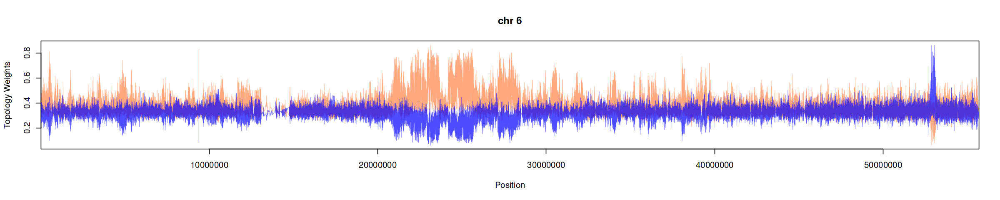

In [14]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr6, 'chr 6', 0.7)

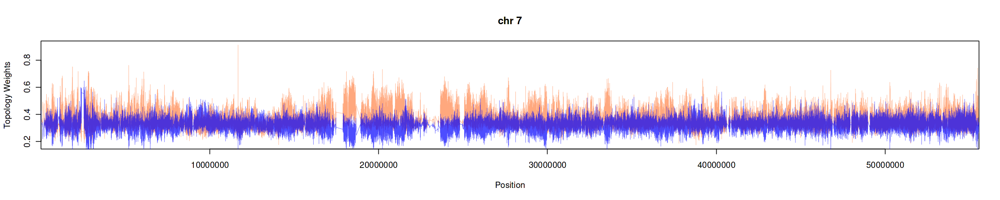

In [15]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr7, 'chr 7', 0.7)

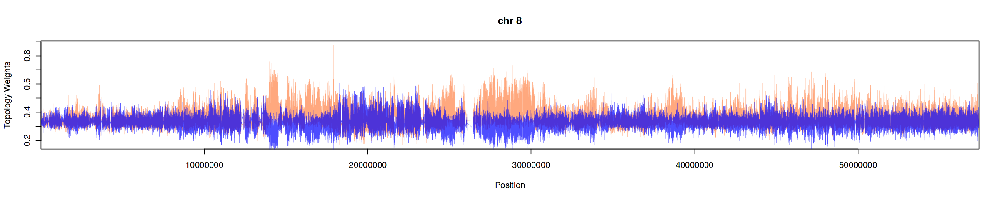

In [16]:
options(repr.plot.width=20, repr.plot.height=4)
par(mfrow=c(1,1), xaxs='i')
# plot(wt1~start, chr1, type='l', col=alpha('sienna1',0.5), #ylim=c(0.2,0.8),
#      main='Chr1',ylab='Topology Weights',xlab='Position', lwd=0.5)
# lines(wt2~start, chr1, col=alpha('blue',0.5), lwd=0.5)
plotTopoWt12(chr8, 'chr 8', 0.7)

## Plots: Twisst Examples

In [5]:
source("~/twisst/plot_twisst.R")
weights_file <- "~/twisst/examples/msms_4of10_l1Mb_r10k_sweep.seq_gen.SNP.w50sites.phyml_bionj.weights.tsv.gz"
window_data_file <- "~/twisst/examples/msms_4of10_l1Mb_r10k_sweep.seq_gen.SNP.w50sites.phyml_bionj.data.tsv.gz"
twisst_data <- import.twisst(weights_files=weights_file,
                             window_data_files=window_data_file)

[1] "Reading weights and window data"
[1] "Number of regions: 1"
[1] "Computing summaries"
[1] "Cleaning data"
[1] "Getting topologies"


In [19]:
str(twisst_data)

List of 9
 $ window_data         :List of 1
  ..$ contig0:'data.frame':	2550 obs. of  6 variables:
  .. ..$ scaffold: chr [1:2550] "contig0" "contig0" "contig0" "contig0" ...
  .. ..$ start   : int [1:2550] 4 451 900 1293 1605 1953 2380 2826 3251 3544 ...
  .. ..$ end     : int [1:2550] 448 893 1278 1604 1943 2371 2819 3249 3543 3987 ...
  .. ..$ mid     : int [1:2550] 225 658 1059 1441 1788 2123 2624 3073 3400 3766 ...
  .. ..$ sites   : int [1:2550] 50 50 50 50 50 50 50 50 50 50 ...
  .. ..$ lnL     : num [1:2550] -439 -388 -400 -378 -451 ...
 $ weights_raw         :List of 1
  ..$ contig0:'data.frame':	2550 obs. of  3 variables:
  .. ..$ topo1: num [1:2550] 0.9 0.9 0.9 0.7 1 1 0 0.37 1 1 ...
  .. ..$ topo2: num [1:2550] 0 0 0 0 0 0 0.2 0.18 0 0 ...
  .. ..$ topo3: num [1:2550] 0.1 0.1 0.1 0.3 0 0 0.8 0.45 0 0 ...
 $ n_regions           : int 1
 $ weights             :List of 1
  ..$ contig0:'data.frame':	2550 obs. of  3 variables:
  .. ..$ topo1: num [1:2550] 0.9 0.9 0.9 0.7 1 1 0 0

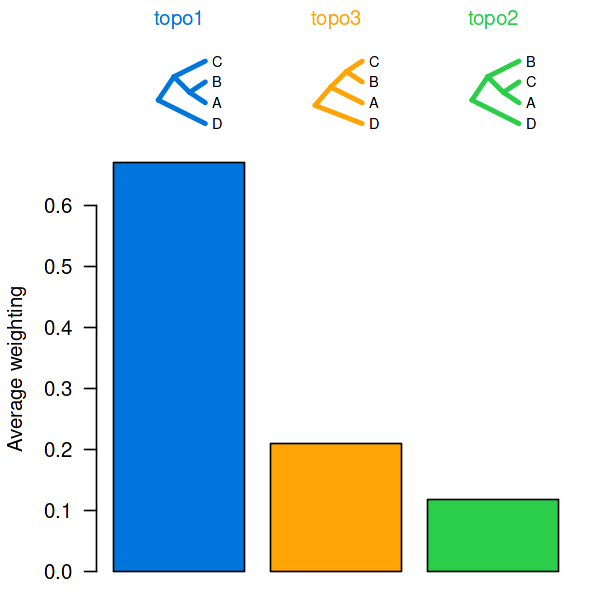

In [6]:
options(repr.plot.width=5, repr.plot.height=5)
plot.twisst.summary(twisst_data, lwd=3, cex=0.7)

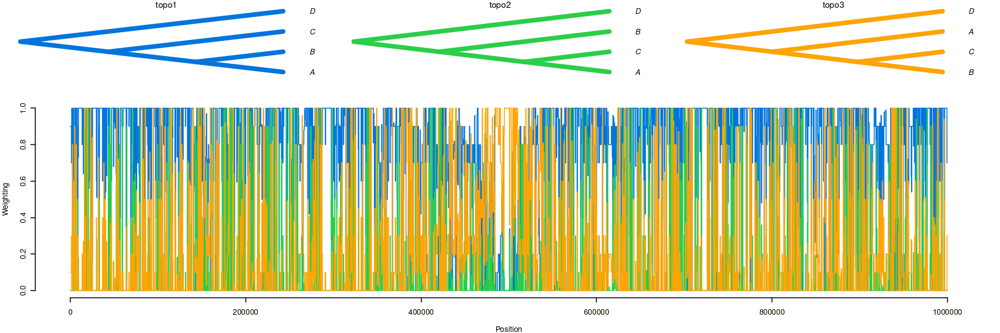

In [52]:
options(repr.plot.width=15, repr.plot.height=5)
plot.twisst(twisst_data, mode=1, show_topos=TRUE)

[1] "smoothing topo1"
[1] "smoothing topo2"
[1] "smoothing topo3"


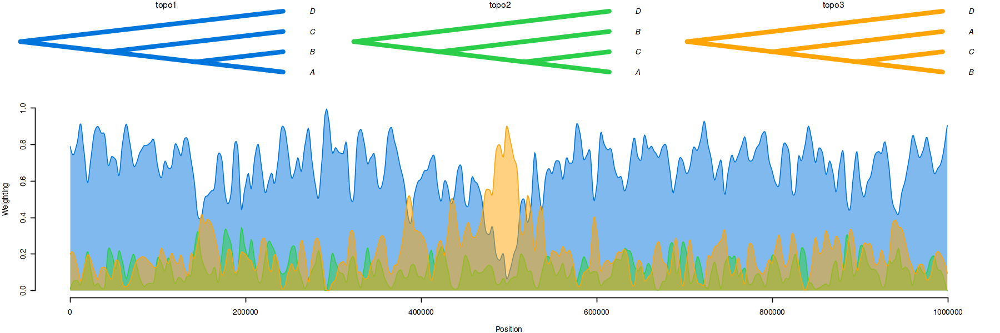

In [53]:
options(repr.plot.width=15, repr.plot.height=5)
# make smooth weightings and plot those across chromosomes
twisst_data_smooth <- smooth.twisst(twisst_data, span_bp = 20000, spacing = 1000)
plot.twisst(twisst_data_smooth, mode=2) #mode 2 overlays polygons, mode 3 would stack them

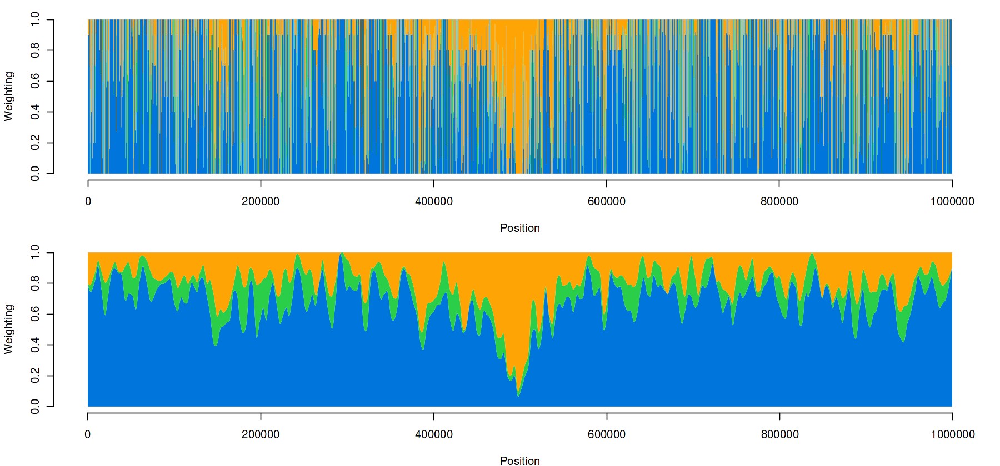

In [55]:
options(repr.plot.width=15, repr.plot.height=7)

par(mfrow = c(2,1), mar = c(4,4,1,1))
plot.weights(weights_dataframe=twisst_data$weights[[1]], positions=twisst_data$window_data[[1]][,c("start","end")],
             line_cols=topo_cols, fill_cols=topo_cols, stacked=TRUE)
plot.weights(weights_dataframe=twisst_data_smooth$weights[[1]], positions=twisst_data_smooth$pos[[1]],
             line_cols=topo_cols, fill_cols=topo_cols, stacked=TRUE)

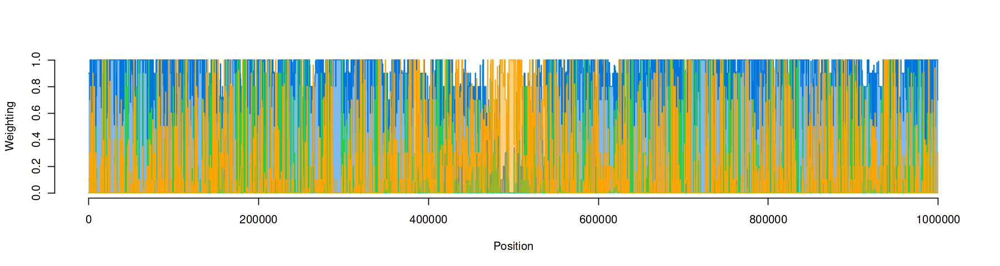

In [58]:
options(repr.plot.width=15, repr.plot.height=4)
plot.weights(weights_dataframe=twisst_data$weights[[1]], positions=twisst_data$window_data[[1]][,c("start","end")],
             line_cols=topo_cols, fill_cols=paste0(topo_cols,80), stacked=FALSE)

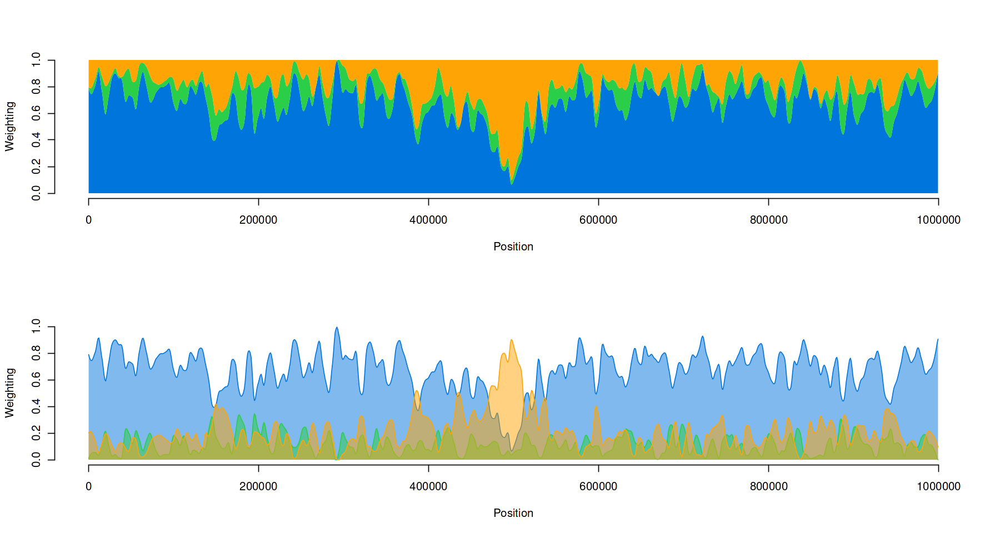

In [62]:
options(repr.plot.width=15, repr.plot.height=8)

par(mfrow=c(2,1))
#plot smoothed data with polygons stacked
plot.weights(weights_dataframe=twisst_data_smooth$weights[[1]], positions=twisst_data_smooth$pos[[1]],
             line_cols=topo_cols, fill_cols=topo_cols, stacked=TRUE)

#plot smoothed data with polygons unstacked
plot.weights(weights_dataframe=twisst_data_smooth$weights[[1]], positions=twisst_data_smooth$pos[[1]],
             line_cols=topo_cols, fill_cols=paste0(topo_cols,80), stacked=FALSE)

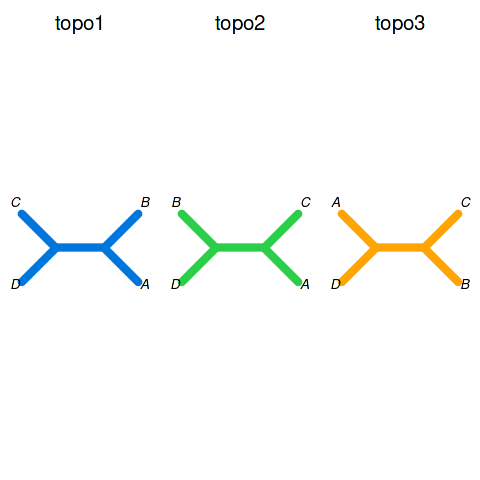

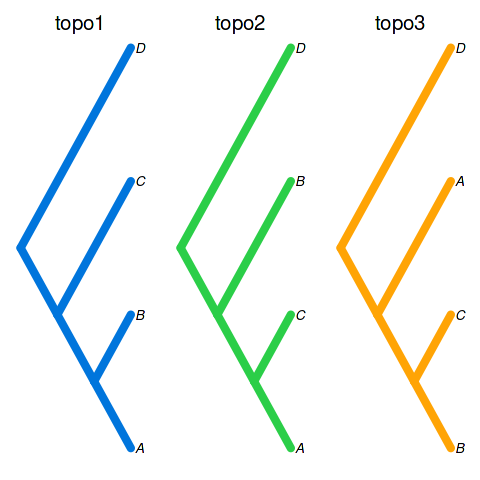

In [64]:
options(repr.plot.width=4, repr.plot.height=4)

#unrooted trees
for (i in 1:length(twisst_data$topos)) twisst_data$topos[[i]] <- ladderize(unroot(twisst_data$topos[[i]]))

par(mfrow = c(1,length(twisst_data$topos)), mar = c(1,1,2,1), xpd=NA)
for (n in 1:length(twisst_data$topos)){
  plot.phylo(twisst_data$topos[[n]], type = "unrooted", edge.color=topo_cols[n], edge.width=5, rotate.tree = 90, cex = 1, adj = .5, label.offset=.2)
  mtext(side=3,text=paste0("topo",n))
  }


#rooted topologies
for (i in 1:length(twisst_data$topos)) twisst_data$topos[[i]] <- root(twisst_data$topos[[i]], "D", resolve.root = T)

par(mfrow = c(1,length(twisst_data$topos)), mar = c(1,1,2,1), xpd=NA)
for (n in 1:length(twisst_data$topos)){
  plot.phylo(twisst_data$topos[[n]], type = "clad", edge.color=topo_cols[n], edge.width=5, label.offset=.1, cex = 1)
  mtext(side=3,text=paste0("topo",n))
  }

In [65]:
#read in the raw trees (newick format, can be gzipped)
trees <- read.tree("~/twisst/examples/msms_4of10_l1Mb_r10k_sweep.seq_gen.SNP.w50sites.phyml_bionj.trees.gz")

#Fins all windows in which Topo2 has a weighting above 0.9 
#Note that to do this we have to look inside the twisst_data object
which(twisst_data$weights$contig0$topo2 > 0.9)

#Specify the window for which we want to plot the tree
i=46

#check where on the chromosome this tree appears
twisst_data$window_data$contig0[i,]

[1]   46   52  117  149  177  281  290  369  373  414  445  446  447  452  465
[16]  469  473  494  505  506  521  527  528  548  588  597  633  642  653  666
[31]  723  732  769  867  872 1055 1060 1071 1084 1087 1391 1401 1458 1467 1492
[46] 1505 1612 1635 1637 1664 1686 1735 1748 1751 1753 1755 1791 1792 1819 1837
[61] 1867 1874 1907 1926 2050 2058 2089 2110 2116 2133 2137 2138 2224 2265 2267
[76] 2306 2407 2409 2419 2464 2493

,scaffold,start,end,mid,sites,lnL
,<chr>,<int>,<int>,<int>,<int>,<dbl>
46,contig0,18041,18319,18173,50,-360.9613


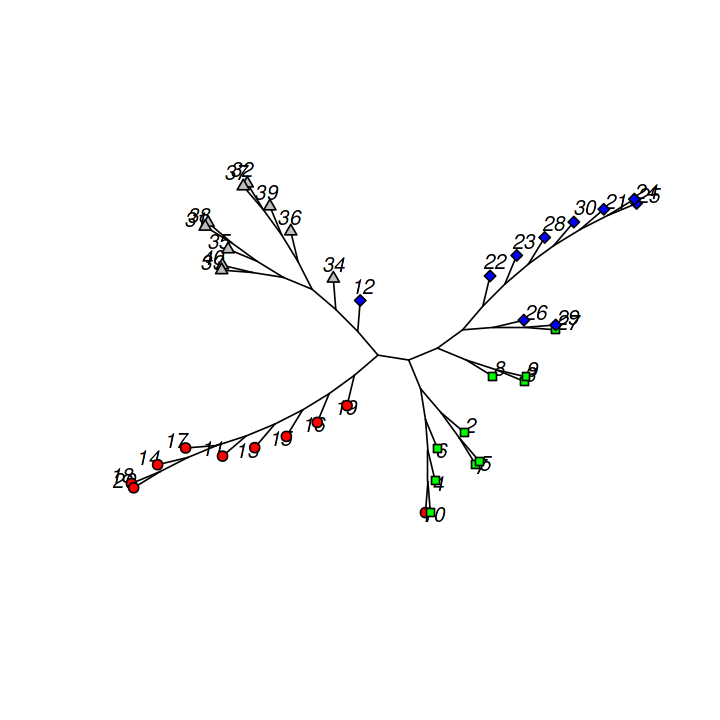

In [68]:
options(repr.plot.width=6, repr.plot.height=6)
#plot either an unrooted or rooted tree.
#Note his is a function in the package 'ape' read about the options here https://cran.r-project.org/web/packages/ape/ape.pdf
plot.phylo(trees[[i]], type="unrooted", use.edge.length=F)
#plot.phylo(trees[[i]], type="cladgram", use.edge.length=F)

#add symbols for tips (again, this is a fucntion from ape)
tiplabels(pch = c(rep(21,10), rep(22,10), rep(23,10), rep(24,10)),
          bg =  c(rep("red",10), rep("green",10), rep("blue",10), rep("gray",10)),
          col = "black", cex = 1, adj = 0.5)

## Plots: Smooth Tests

In [9]:
chromLength = 77118269
# span = span_bp/chromLength
# smooth.100bp = loess.smooth.weights(chr2$wt2, chr2$mid, chr2$sites, span = 100/chromLength, "gaussian") ##DOESN"T RUN
# smooth.1k = loess.smooth.weights(chr2$wt2, chr2$mid, chr2$sites, span = 1000/chromLength, "gaussian")
smooth.10k = loess.smooth.weights(chr2$wt2, chr2$mid, chr2$sites, span = 10000/chromLength, "gaussian")
smooth.100k = loess.smooth.weights(chr2$wt2, chr2$mid, chr2$sites, span = 100000/chromLength, "gaussian")
smooth.1M = loess.smooth.weights(chr2$wt2, chr2$mid, chr2$sites, span = 1000000/chromLength, "gaussian")

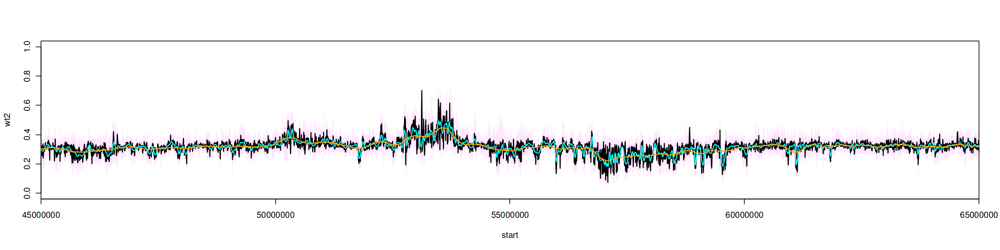

In [13]:
options(repr.plot.width=20, repr.plot.height=5)

par(xaxs='i')
xLimits = c(45000000,65000000)
# xLimits = c(52000000,54000000)

plot(wt2~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('plum1',0.4), type='s', xlim=xLimits)
# lines(chr2$mid, smooth.1k, col='sienna1', lwd=1.5)
lines(chr2$mid, smooth.10k, col='black', lwd=1.5)
lines(chr2$mid, smooth.100k, col='cyan', lwd=1.5)
lines(chr2$mid, smooth.1M, col='orange', lwd=1.5)

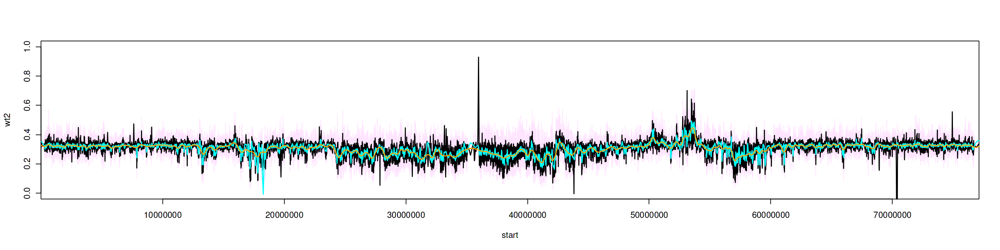

In [14]:
options(repr.plot.width=20, repr.plot.height=5)
par(xaxs='i')
chromLength = 77118269
xLimits = c(1,chromLength)
# xLimits = c(45000000,65000000)
# xLimits = c(52000000,54000000)

plot(wt2~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('plum1',0.4), type='s', xlim=xLimits)
# lines(chr2$mid, smooth.1k, col='sienna1', lwd=1.5)
lines(chr2$mid, smooth.10k, col='black', lwd=1.5)
lines(chr2$mid, smooth.100k, col='cyan', lwd=1.5)
lines(chr2$mid, smooth.1M, col='orange', lwd=1.5)

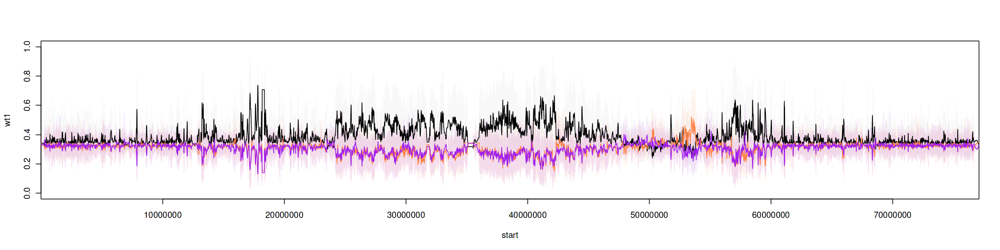

In [47]:
options(repr.plot.width=20, repr.plot.height=5)

par(xaxs='i')
plot(wt1~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('grey',0.1), type='l')
lines(wt2~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('sienna1',0.1))
lines(wt3~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('purple',0.1))

lines(y1.predict~start, chr2, col='black', type='s')
lines(y2.predict~start, chr2, col='sienna1', type='s')
lines(y3.predict~start, chr2, col='purple', type='s')

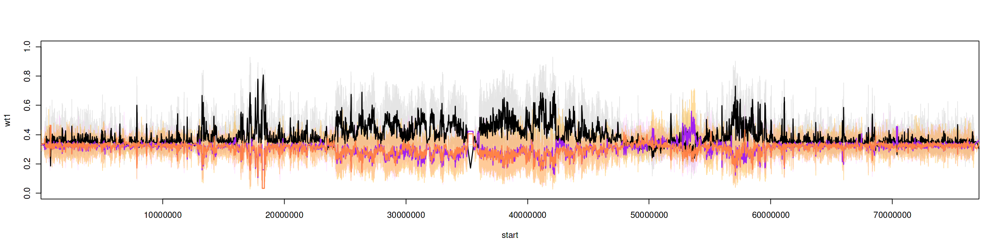

In [22]:
# span=50000
options(repr.plot.width=20, repr.plot.height=5)

par(xaxs='i')
chromLength = 77118269
xLimits = c(1,chromLength)
# xLimits = c(45000000,65000000)
# xLimits = c(52000000,52200000)

plot(wt1~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('grey',0.4), type='l', xlim=xLimits)
lines(wt3~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('plum1',0.4))
lines(wt2~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('orange',0.4))

lines(wt1.smooth~mid, chr2, col='black', type='s', lwd=1.5)
lines(wt2.smooth~mid, chr2, col='purple', type='s', lwd=1.5)
lines(wt3.smooth~mid, chr2, col='sienna1', type='s', lwd=1.5)

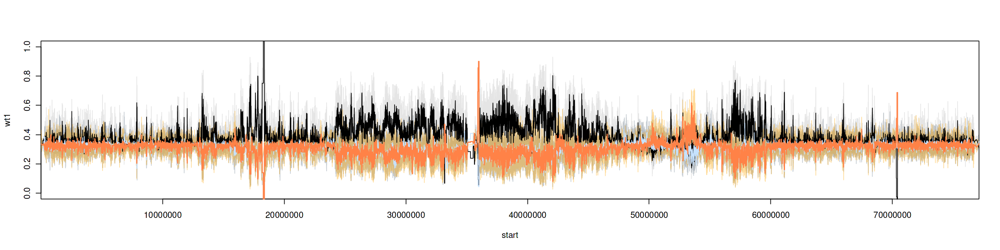

In [30]:
# span=20000
options(repr.plot.width=20, repr.plot.height=5)

par(xaxs='i')
chromLength = 77118269
xLimits = c(1,chromLength)
# xLimits = c(45000000,65000000)
# xLimits = c(52000000,52200000)

plot(wt1~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('grey',0.4), type='l', xlim=xLimits)
lines(wt3~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('slategrey',0.4))
lines(wt2~start, chr2, ylim=c(0,1), cex=0.1, col=alpha('orange',0.4))

lines(wt1.smooth~mid, chr2, col='black', type='s', lwd=1)
lines(wt3.smooth~mid, chr2, col='slategray1', type='s', lwd=1)
lines(wt2.smooth~mid, chr2, col='sienna1', type='s', lwd=1.5)

## Plots: Final

In [14]:
plotWeights = function(dat){
    # plot_theme <- theme_bw() + theme(panel.grid = element_blank())
    plot_theme <- theme_classic() + theme(panel.grid = element_blank())
    ggplot(dat, aes(x=mid)) +
        # geom_step(aes(y=wt1), col='grey', alpha=0.2) +
        # geom_step(aes(y=wt3), col='snow1', alpha=0.2) +
        # geom_step(aes(y=wt2), col='orange', alpha=0.2) +
    
        geom_step(aes(y=wt1.smooth), col='black', alpha=1, linewidth=0.4) +
        geom_step(aes(y=wt2.smooth), col='sienna1', alpha=1, linewidth=0.7) +
        geom_step(aes(y=wt3.smooth), col='snow3', alpha=1, linewidth=0.4) +
        
        scale_x_continuous(expand=c(0,0), limits=c(1,max(dat$end)), 
                           label=NULL, 
                           # label=seq(10,max(dat$end)/1000000,10), 
                           breaks=seq(10,max(dat$end),10000000)) +
        scale_y_continuous(limits=c(0.2,0.8)) +
        labs(x='', y='', title='') +
        
        # Customize the theme:
        plot_theme +
        theme(plot.margin = unit(c(0,1,0,1),'pt'))
        # theme(legend.position = "none",
        #       plot.title = element_text(hjust = 0.5, size=20), 
        #       axis.title = element_text(size = 18),
        #       axis.text.y = element_text(size = 12),
        #       axis.text.x = element_text(size = 18, vjust = 0.2, color = 'black')
        #      )
}

In [15]:
plotWidths = c(max(chr1$end), max(chr2$end), max(chr3$end), max(chr4$end), max(chr5$end), max(chr6$end), max(chr7$end), max(chr8$end))
plotWidths = plotWidths/max(plotWidths)
plotWidths

[1] 0.9325128 1.0000000 0.8455978 0.7116862 0.9204541 0.7222110 0.7204576
[8] 0.7443557

In [16]:
blankPlot = ggplot() + geom_blank() + theme_void()
plt1 = plotWeights(chr1) 
plt2 = plotWeights(chr2)
plt3 = plotWeights(chr3)
plt4 = plotWeights(chr4)
plt5 = plotWeights(chr5)
plt6 = plotWeights(chr6)
plt7 = plotWeights(chr7)
plt8 = plotWeights(chr8)

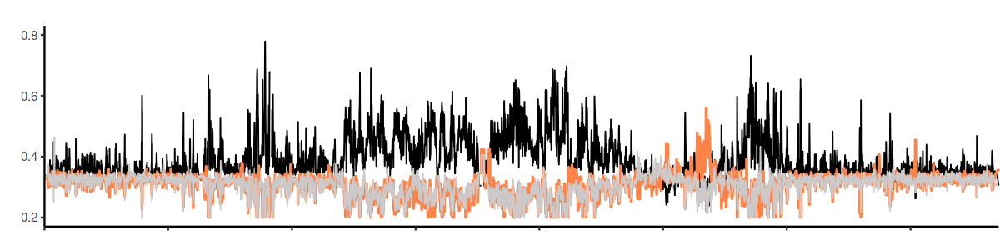

In [18]:
options(repr.plot.width = 10, repr.plot.height = 2.5)
plt2

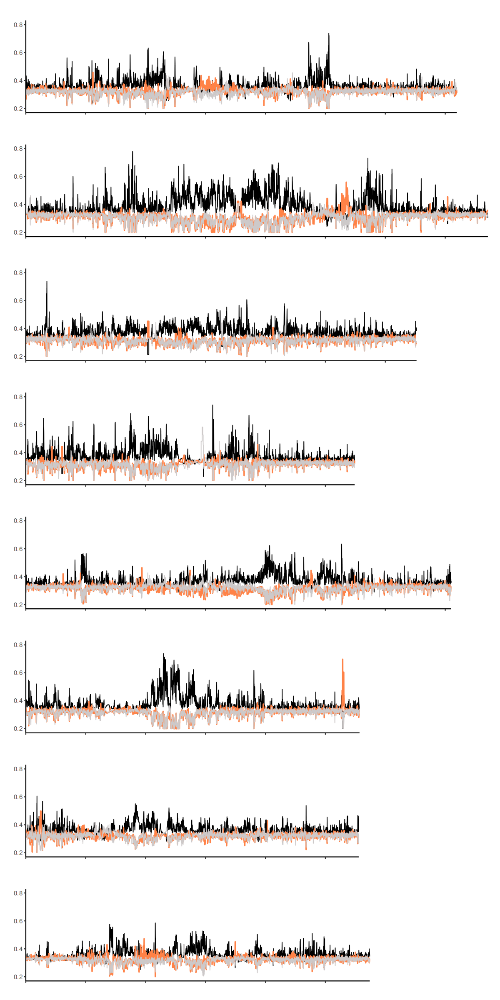

In [17]:
options(repr.plot.width=10, repr.plot.height=20)
    (plt1 + plot_spacer() + plot_layout(widths = c(plotWidths[1], 1-plotWidths[1]))) / 
    (plt2 + plot_spacer() + plot_layout(widths = c(plotWidths[2], 1-plotWidths[2]))) /
    (plt3 + plot_spacer() + plot_layout(widths = c(plotWidths[3], 1-plotWidths[3]))) /
    (plt4 + plot_spacer() + plot_layout(widths = c(plotWidths[4], 1-plotWidths[4]))) /
    (plt5 + plot_spacer() + plot_layout(widths = c(plotWidths[5], 1-plotWidths[5]))) /
    (plt6 + plot_spacer() + plot_layout(widths = c(plotWidths[6], 1-plotWidths[6]))) /
    (plt7 + plot_spacer() + plot_layout(widths = c(plotWidths[7], 1-plotWidths[7]))) /
    (plt8 + plot_spacer() + plot_layout(widths = c(plotWidths[8], 1-plotWidths[8])))

In [76]:
options(repr.plot.width=10, repr.plot.height=20)
fullPlot = (plt1 + plot_spacer() + plot_layout(widths = c(plotWidths[1], 1-plotWidths[1]))) / 
    (plt2 + plot_spacer() + plot_layout(widths = c(plotWidths[2], 1-plotWidths[2]))) /
    (plt3 + plot_spacer() + plot_layout(widths = c(plotWidths[3], 1-plotWidths[3]))) /
    (plt4 + plot_spacer() + plot_layout(widths = c(plotWidths[4], 1-plotWidths[4]))) /
    (plt5 + plot_spacer() + plot_layout(widths = c(plotWidths[5], 1-plotWidths[5]))) /
    (plt6 + plot_spacer() + plot_layout(widths = c(plotWidths[6], 1-plotWidths[6]))) /
    (plt7 + plot_spacer() + plot_layout(widths = c(plotWidths[7], 1-plotWidths[7]))) /
    (plt8 + plot_spacer() + plot_layout(widths = c(plotWidths[8], 1-plotWidths[8])))

In [77]:
ggsave(fullPlot, filename='~/snap_hap_repHZ/twisst/_figures/twisst_relate_iter5.pdf', width=10, height=16)

## Plots: regions with high Tc

In [4]:
## YELLOW
cremosa = c(821293, 1095277) #chr1
aurina = c(951685, 1153653) #chr2
flavia = c(53368062, 53569435) #chr2
sulf = c(38248572, 38450336) #chr4

## MAGENTA
rubia = c(6169966, 6372151) #chr5
rosel = c(52789323, 53162505) #chr6

In [36]:
nrow(allchrom)
nrow(allchrom[(asymTc55 != -1)])/nrow(allchrom)*100
nrow(allchrom[(asymTc60 != -1)])/nrow(allchrom)*100

[1] 4975454

[1] 0.02994702

[1] 0.01374749

In [49]:
## Regions with high Tc around color loci
cat('Tc >= 0.55\n')
nrow(allchrom[asymTc55 != -1])
nrow(allchrom[(asymTc55 != -1) & chrom=='Chr6' & start <= 53.5e6 & end >= 52.5e6]); 
779/1490   ##rosel
nrow(allchrom[(asymTc55 != -1) & chrom=='Chr2' & start <= 54.5e6 & end >= 52e6]); 
202/1490   ##flavia

cat('\nTc >= 0.6\n')
nrow(allchrom[asymTc60 != -1])
nrow(allchrom[(asymTc60 != -1) & chrom=='Chr6' & start <= 53.5e6 & end >= 52.5e6]); 
473/684   ##rosel
nrow(allchrom[(asymTc60 != -1) & chrom=='Chr2' & start <= 54.5e6 & end >= 52e6]); 
174/684   ##flavia

Tc >= 0.55


[1] 1490

[1] 745

[1] 0.5228188

[1] 495

[1] 0.1355705


Tc >= 0.6


[1] 684

[1] 473

[1] 0.6915205

[1] 174

[1] 0.254386

In [91]:
##
plotWeights = function(dat, colorName='black'){
    # plot_theme <- theme_bw() + theme(panel.grid = element_blank())
    plot_theme <- theme_classic() + theme(panel.grid = element_blank())
    plt = ggplot(dat, aes(x=mid)) +
        # geom_step(aes(y=wt1), col='grey', alpha=0.2) +
        # geom_step(aes(y=wt3), col='snow1', alpha=0.2) +
        # geom_step(aes(y=wt2), col='orange', alpha=0.2) +
    
        geom_step(aes(y=wt1.smooth), col='black', alpha=1, linewidth=0.4) +
        geom_step(aes(y=wt2.smooth), col='sienna1', alpha=1, linewidth=0.7) +
        geom_step(aes(y=wt3.smooth), col='snow3', alpha=1, linewidth=0.4) +

        geom_point(aes(y=asymTc55), cex=2.5, pch=6, col='black') +
        geom_point(aes(y=asymTc60), cex=2.5, pch=6, col='red') +
        
        scale_x_continuous(expand=c(0,0), limits=c(1,max(dat$end)), 
                           label=NULL, 
                           # label=seq(10,max(dat$end)/1000000,10), 
                           breaks=seq(10,max(dat$end),10000000)) +
        scale_y_continuous(limits=c(0.2,0.8)) +
        labs(x='', y='', title='') +
        
        # Customize the theme:
        plot_theme +
        theme(plot.margin = unit(c(0,1,0,1),'pt'))
        # theme(legend.position = "none",
        #       plot.title = element_text(hjust = 0.5, size=20), 
        #       axis.title = element_text(size = 18),
        #       axis.text.y = element_text(size = 12),
        #       axis.text.x = element_text(size = 18, vjust = 0.2, color = 'black')
        #      )

    return(plt)
}

##
plotWeights_asymTc = function(dat, colorName='black'){
    # plot_theme <- theme_bw() + theme(panel.grid = element_blank())
    plot_theme <- theme_classic() + theme(panel.grid = element_blank())
    plt = ggplot(dat, aes(x=mid)) +
                    geom_point(aes(y=asymTc55), cex=2.5, pch=6, col=colorName) +
                    geom_point(aes(y=asymTc60), cex=2.5, pch=6, col='red') +
            
                    # annotate("rect", xmin=as.numeric(rosel[2]), xmax=as.numeric(rosel[2]), ymin = 0, ymax = 0.8) +
                
                    scale_x_continuous(expand=c(0,0), limits=c(1,max(dat$end)), 
                                       label=NULL,
                                       breaks=seq(10,max(dat$end),10000000)) +
                    scale_y_continuous(limits=c(0.2,0.8)) +
                    labs(x='', y='', title='') +
                    
                    # Customize the theme:
                    plot_theme +
                    theme(plot.margin = unit(c(0,1,0,1),'pt'))
    return(plt)
}

In [92]:
plotWidths = c(max(chr1$end), max(chr2$end), max(chr3$end), max(chr4$end), max(chr5$end), max(chr6$end), max(chr7$end), max(chr8$end))
plotWidths = plotWidths/max(plotWidths)
plotWidths

[1] 0.9325128 1.0000000 0.8455978 0.7116862 0.9204541 0.7222110 0.7204576
[8] 0.7443557

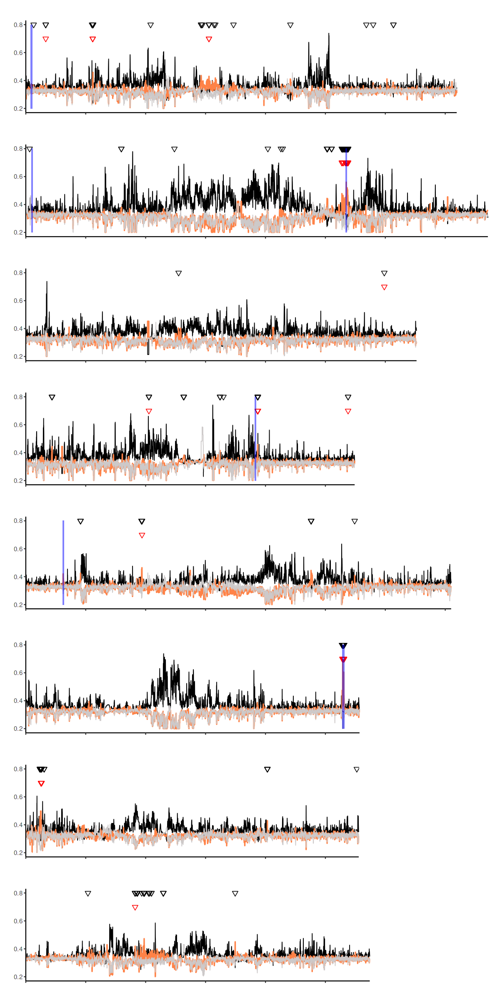

In [82]:
options(warn=-1, repr.plot.width=10, repr.plot.height=20)

blankPlot = ggplot() + geom_blank() + theme_void()
plt1 = plotWeights(allchrom[chrom=='Chr1']) +
            annotate("rect", xmin=cremosa[1], xmax=cremosa[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) 
plt2 = plotWeights(allchrom[chrom=='Chr2']) + 
            annotate("rect", xmin=aurina[1], xmax=aurina[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) +
            annotate("rect", xmin=flavia[1], xmax=flavia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt3 = plotWeights(allchrom[chrom=='Chr3'])
plt4 = plotWeights(allchrom[chrom=='Chr4']) +
            annotate("rect", xmin=sulf[1], xmax=sulf[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt5 = plotWeights(allchrom[chrom=='Chr5']) +
            annotate("rect", xmin=rubia[1], xmax=rubia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt6 = plotWeights(allchrom[chrom=='Chr6']) + 
        annotate("rect", xmin=rosel[1], xmax=rosel[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt7 = plotWeights(allchrom[chrom=='Chr7'])
plt8 = plotWeights(allchrom[chrom=='Chr8'])

# plot
    (plt1 + plot_spacer() + plot_layout(widths = c(plotWidths[1], 1-plotWidths[1]))) / 
    (plt2 + plot_spacer() + plot_layout(widths = c(plotWidths[2], 1-plotWidths[2]))) /
    (plt3 + plot_spacer() + plot_layout(widths = c(plotWidths[3], 1-plotWidths[3]))) /
    (plt4 + plot_spacer() + plot_layout(widths = c(plotWidths[4], 1-plotWidths[4]))) /
    (plt5 + plot_spacer() + plot_layout(widths = c(plotWidths[5], 1-plotWidths[5]))) /
    (plt6 + plot_spacer() + plot_layout(widths = c(plotWidths[6], 1-plotWidths[6]))) /
    (plt7 + plot_spacer() + plot_layout(widths = c(plotWidths[7], 1-plotWidths[7]))) /
    (plt8 + plot_spacer() + plot_layout(widths = c(plotWidths[8], 1-plotWidths[8])))

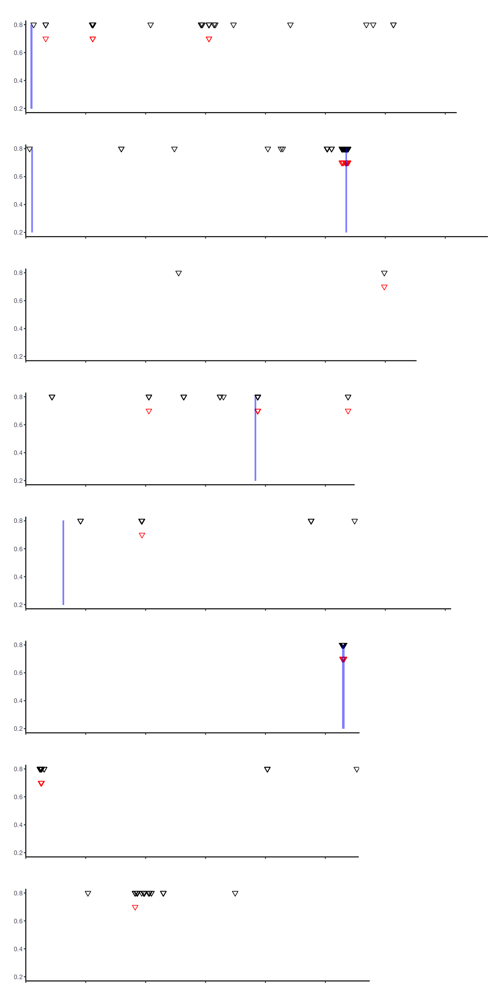

In [81]:
options(warn=-1, repr.plot.width=10, repr.plot.height=20)
blankPlot = ggplot() + geom_blank() + theme_void()
plt1 = plotWeights_asymTc(allchrom[chrom=='Chr1']) +
            annotate("rect", xmin=cremosa[1], xmax=cremosa[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) 
plt2 = plotWeights_asymTc(allchrom[chrom=='Chr2'])  +
            annotate("rect", xmin=aurina[1], xmax=aurina[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) + 
            annotate("rect", xmin=flavia[1], xmax=flavia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) 
plt3 = plotWeights_asymTc(allchrom[chrom=='Chr3'])
plt4 = plotWeights_asymTc(allchrom[chrom=='Chr4']) + 
        annotate("rect", xmin=sulf[1], xmax=sulf[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt5 = plotWeights_asymTc(allchrom[chrom=='Chr5']) + 
        annotate("rect", xmin=rubia[1], xmax=rubia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt6 = plotWeights_asymTc(allchrom[chrom=='Chr6']) + 
        annotate("rect", xmin=rosel[1], xmax=rosel[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt7 = plotWeights_asymTc(allchrom[chrom=='Chr7'])
plt8 = plotWeights_asymTc(allchrom[chrom=='Chr8'])

## plot
    (plt1 + plot_spacer() + plot_layout(widths = c(plotWidths[1], 1-plotWidths[1]))) / 
    (plt2 + plot_spacer() + plot_layout(widths = c(plotWidths[2], 1-plotWidths[2]))) /
    (plt3 + plot_spacer() + plot_layout(widths = c(plotWidths[3], 1-plotWidths[3]))) /
    (plt4 + plot_spacer() + plot_layout(widths = c(plotWidths[4], 1-plotWidths[4]))) /
    (plt5 + plot_spacer() + plot_layout(widths = c(plotWidths[5], 1-plotWidths[5]))) /
    (plt6 + plot_spacer() + plot_layout(widths = c(plotWidths[6], 1-plotWidths[6]))) /
    (plt7 + plot_spacer() + plot_layout(widths = c(plotWidths[7], 1-plotWidths[7]))) /
    (plt8 + plot_spacer() + plot_layout(widths = c(plotWidths[8], 1-plotWidths[8])))

In [94]:
options(warn=-1, repr.plot.width=10, repr.plot.height=20)

blankPlot = ggplot() + geom_blank() + theme_void()
plt1 = plotWeights(allchrom[chrom=='Chr1']) +
            annotate("rect", xmin=cremosa[1], xmax=cremosa[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) 
plt2 = plotWeights(allchrom[chrom=='Chr2']) + 
            annotate("rect", xmin=aurina[1], xmax=aurina[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) +
            annotate("rect", xmin=flavia[1], xmax=flavia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt3 = plotWeights(allchrom[chrom=='Chr3'])
plt4 = plotWeights(allchrom[chrom=='Chr4']) +
            annotate("rect", xmin=sulf[1], xmax=sulf[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt5 = plotWeights(allchrom[chrom=='Chr5']) +
            annotate("rect", xmin=rubia[1], xmax=rubia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt6 = plotWeights(allchrom[chrom=='Chr6']) + 
        annotate("rect", xmin=rosel[1], xmax=rosel[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt7 = plotWeights(allchrom[chrom=='Chr7'])
plt8 = plotWeights(allchrom[chrom=='Chr8'])

# plot
fullPlot =  (plt1 + plot_spacer() + plot_layout(widths = c(plotWidths[1], 1-plotWidths[1]))) / 
    (plt2 + plot_spacer() + plot_layout(widths = c(plotWidths[2], 1-plotWidths[2]))) /
    (plt3 + plot_spacer() + plot_layout(widths = c(plotWidths[3], 1-plotWidths[3]))) /
    (plt4 + plot_spacer() + plot_layout(widths = c(plotWidths[4], 1-plotWidths[4]))) /
    (plt5 + plot_spacer() + plot_layout(widths = c(plotWidths[5], 1-plotWidths[5]))) /
    (plt6 + plot_spacer() + plot_layout(widths = c(plotWidths[6], 1-plotWidths[6]))) /
    (plt7 + plot_spacer() + plot_layout(widths = c(plotWidths[7], 1-plotWidths[7]))) /
    (plt8 + plot_spacer() + plot_layout(widths = c(plotWidths[8], 1-plotWidths[8])))

ggsave(fullPlot, filename='~/snap_hap_repHZ/twisst/_figures/twisst_relate_highTc.pdf', width=10, height=16)

In [95]:
options(warn=-1, repr.plot.width=10, repr.plot.height=20)
blankPlot = ggplot() + geom_blank() + theme_void()
plt1 = plotWeights_asymTc(allchrom[chrom=='Chr1']) +
            annotate("rect", xmin=cremosa[1], xmax=cremosa[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) 
plt2 = plotWeights_asymTc(allchrom[chrom=='Chr2'])  +
            annotate("rect", xmin=aurina[1], xmax=aurina[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) + 
            annotate("rect", xmin=flavia[1], xmax=flavia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5) 
plt3 = plotWeights_asymTc(allchrom[chrom=='Chr3'])
plt4 = plotWeights_asymTc(allchrom[chrom=='Chr4']) + 
        annotate("rect", xmin=sulf[1], xmax=sulf[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt5 = plotWeights_asymTc(allchrom[chrom=='Chr5']) + 
        annotate("rect", xmin=rubia[1], xmax=rubia[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt6 = plotWeights_asymTc(allchrom[chrom=='Chr6']) + 
        annotate("rect", xmin=rosel[1], xmax=rosel[2], ymin = 0.2, ymax = 0.8, bg='blue', alpha = 0.5, linewidth=5)
plt7 = plotWeights_asymTc(allchrom[chrom=='Chr7'])
plt8 = plotWeights_asymTc(allchrom[chrom=='Chr8'])

## plot
    fullPlot = (plt1 + plot_spacer() + plot_layout(widths = c(plotWidths[1], 1-plotWidths[1]))) / 
    (plt2 + plot_spacer() + plot_layout(widths = c(plotWidths[2], 1-plotWidths[2]))) /
    (plt3 + plot_spacer() + plot_layout(widths = c(plotWidths[3], 1-plotWidths[3]))) /
    (plt4 + plot_spacer() + plot_layout(widths = c(plotWidths[4], 1-plotWidths[4]))) /
    (plt5 + plot_spacer() + plot_layout(widths = c(plotWidths[5], 1-plotWidths[5]))) /
    (plt6 + plot_spacer() + plot_layout(widths = c(plotWidths[6], 1-plotWidths[6]))) /
    (plt7 + plot_spacer() + plot_layout(widths = c(plotWidths[7], 1-plotWidths[7]))) /
    (plt8 + plot_spacer() + plot_layout(widths = c(plotWidths[8], 1-plotWidths[8])))

ggsave(fullPlot, filename='~/snap_hap_repHZ/twisst/_figures/twisst_relate_highTc_blankplot.pdf', width=10, height=16)

## Color genes

In [5]:
## YELLOW
cremosa = c(821293, 1095277) #chr1
aurina = c(951685, 1153653) #chr2
flavia = c(53368062, 53569435) #chr2
sulf = c(38248572, 38450336) #chr4

## MAGENTA
rubia = c(6169966, 6372151) #chr5
rosel = c(52789323, 53162505) #chr6

### CREMOSA

In [114]:
wt_cremosa = chr1[start<=cremosa[2] & end>=cremosa[1]]
fwrite(wt_cremosa, file='./weights/geneCremosa.chr1.weights.tsv', sep='\t', row.names=F, quote=F)

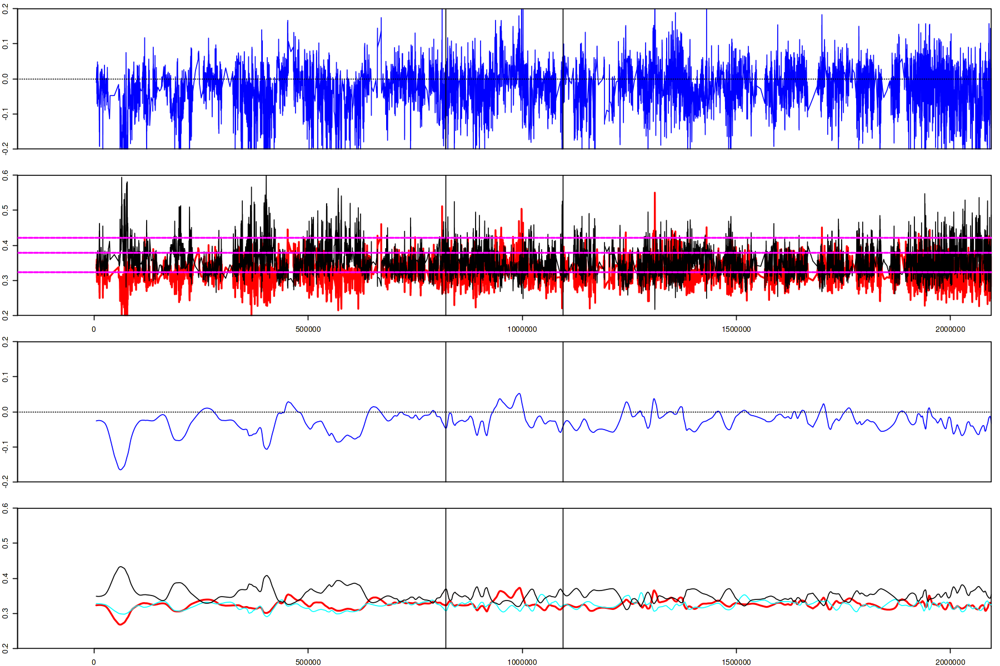

In [91]:
options(repr.plot.height=10, repr.plot.width=15)

# layout(matrix(1:4, ncol=1), heights = c(1, 1, 1, 1))
par(mfrow=c(4,1), xaxs='i', yaxs='i', mar=c(2,2,1,1), cex.axis=1)

dat = chr1
colorGene = cremosa
xLimit = c(colorGene[1]-1000000, colorGene[2]+1000000)

## Raw
plot(dat$mid, dat$wt2-dat$wt1, xlim=xLimit, ylim=c(-0.2,0.2), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2~mid, dat, xlim=xLimit,  ylim=c(0.2,0.6), type='l', col='red', lwd=2)
lines(wt1~mid, dat, type='l', lwd=1)
abline(h = quantile(dat$wt2, probs = c(0.99)), col='magenta', lwd=2, lty='longdash')
abline(h = quantile(dat$wt2, probs = c(0.95)), col='magenta', lwd=2, lty='longdash')
abline(h = median(dat$wt2), col='magenta', lwd=2, lty='longdash')
abline(v = colorGene)


## Smooth
plot(dat$mid, dat$wt2.smooth-dat$wt1.smooth, xlim=xLimit, ylim=c(-0.2,0.2), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2.smooth~mid, dat, xlim=xLimit,  ylim=c(0.2,0.6), type='l', col='red', lwd=2)
lines(wt3.smooth~mid, dat, type='l', lwd=1, col='cyan')
lines(wt1.smooth~mid, dat, type='l', lwd=1)
abline(v=colorGene)

### AURINA

In [113]:
wt_aurina = chr2[start<=aurina[2] & end>=aurina[1]]
fwrite(wt_aurina, file='./weights/geneAurina.chr2.weights.tsv', sep='\t', row.names=F, quote=F)

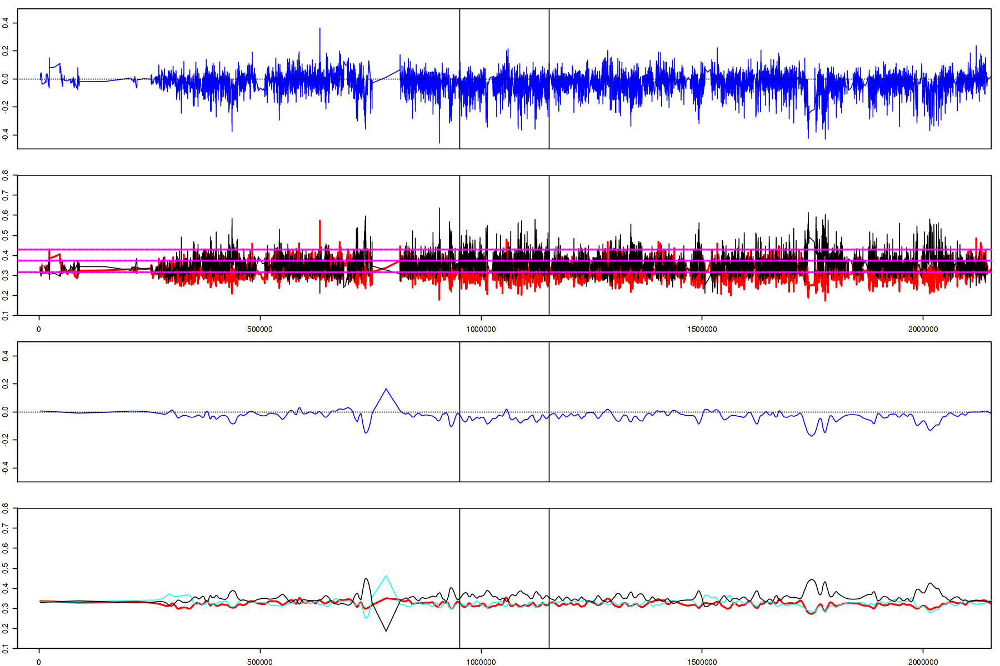

In [92]:
options(repr.plot.height=10, repr.plot.width=15)

# layout(matrix(1:4, ncol=1), heights = c(1, 1, 1, 1))
par(mfrow=c(4,1), xaxs='i', yaxs='i', mar=c(2,2,1,1), cex.axis=1)

dat = chr2
colorGene = aurina
xLimit = c(colorGene[1]-1000000, colorGene[2]+1000000)

## Raw
plot(dat$mid, dat$wt2-dat$wt1, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt1~mid, dat, type='l', lwd=1)
abline(h = quantile(dat$wt2, probs = c(0.99)), col='magenta', lwd=2, lty='longdash')
abline(h = quantile(dat$wt2, probs = c(0.95)), col='magenta', lwd=2, lty='longdash')
abline(h = median(dat$wt2), col='magenta', lwd=2, lty='longdash')
abline(v=colorGene)


## Smooth
plot(dat$mid, dat$wt2.smooth-dat$wt1.smooth, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2.smooth~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt3.smooth~mid, dat, type='l', lwd=1, col='cyan')
lines(wt1.smooth~mid, dat, type='l', lwd=1)
abline(v=colorGene)

### FLAVIA

In [112]:
wt_flavia = chr2[start<=flavia[2] & end>=flavia[1]]
fwrite(wt_flavia, file='./weights/geneFlavia.chr2.weights.tsv', sep='\t', row.names=F, quote=F)

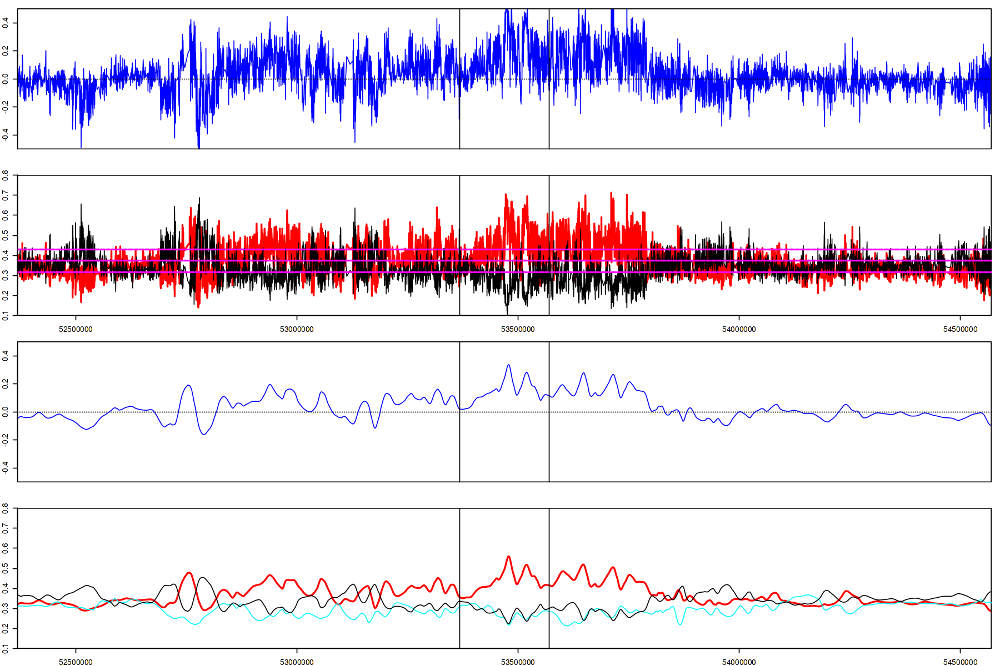

In [93]:
options(repr.plot.height=10, repr.plot.width=15)

# layout(matrix(1:4, ncol=1), heights = c(1, 1, 1, 1))
par(mfrow=c(4,1), xaxs='i', yaxs='i', mar=c(2,2,1,1), cex.axis=1)

dat = chr2
colorGene = flavia
xLimit = c(colorGene[1]-1000000, colorGene[2]+1000000)

## Raw
plot(dat$mid, dat$wt2-dat$wt1, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt1~mid, dat, type='l', lwd=1)
abline(h = quantile(dat$wt2, probs = c(0.99)), col='magenta', lwd=2, lty='longdash')
abline(h = quantile(dat$wt2, probs = c(0.95)), col='magenta', lwd=2, lty='longdash')
abline(h = median(dat$wt2), col='magenta', lwd=2, lty='longdash')
abline(v=colorGene)


## Smooth
plot(dat$mid, dat$wt2.smooth-dat$wt1.smooth, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2.smooth~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt3.smooth~mid, dat, type='l', lwd=1, col='cyan')
lines(wt1.smooth~mid, dat, type='l', lwd=1)
abline(v=colorGene)

### SULF

In [115]:
wt_sulf = chr4[start<=sulf[2] & end>=sulf[1]]
fwrite(wt_sulf, file='./weights/geneSulf.chr4.weights.tsv', sep='\t', row.names=F, quote=F)

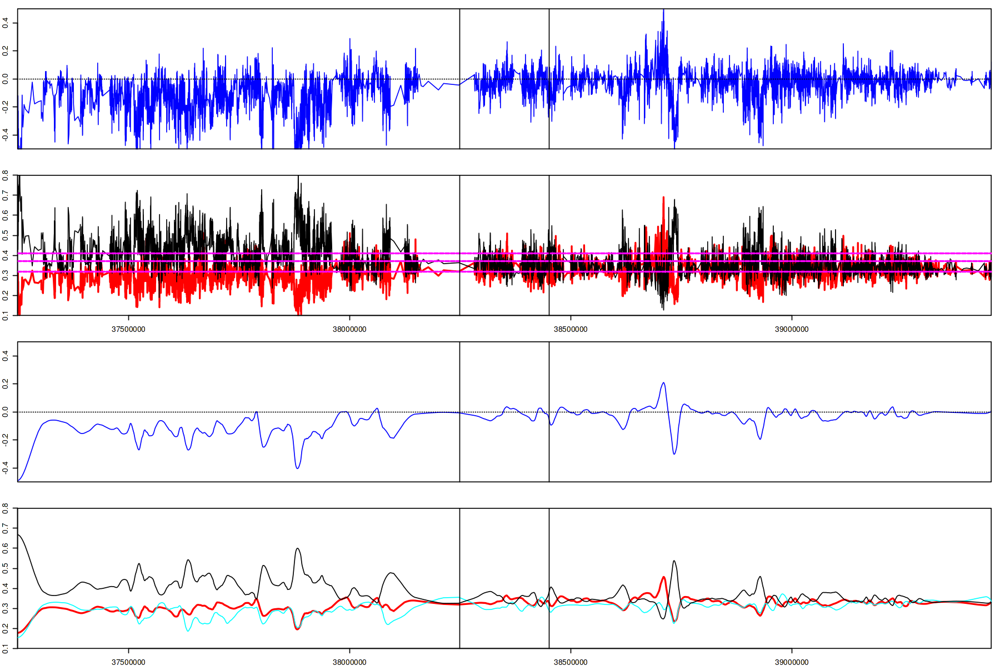

In [94]:
options(repr.plot.height=10, repr.plot.width=15)

# layout(matrix(1:4, ncol=1), heights = c(1, 1, 1, 1))
par(mfrow=c(4,1), xaxs='i', yaxs='i', mar=c(2,2,1,1), cex.axis=1)

dat = chr4
colorGene = sulf
xLimit = c(colorGene[1]-1000000, colorGene[2]+1000000)

## Raw
plot(dat$mid, dat$wt2-dat$wt1, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt1~mid, dat, type='l', lwd=1)
abline(h = quantile(dat$wt2, probs = c(0.99)), col='magenta', lwd=2, lty='longdash')
abline(h = quantile(dat$wt2, probs = c(0.95)), col='magenta', lwd=2, lty='longdash')
abline(h = median(dat$wt2), col='magenta', lwd=2, lty='longdash')
abline(v=colorGene)


## Smooth
plot(dat$mid, dat$wt2.smooth-dat$wt1.smooth, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2.smooth~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt3.smooth~mid, dat, type='l', lwd=1, col='cyan')
lines(wt1.smooth~mid, dat, type='l', lwd=1)
abline(v=colorGene)

### RUBIA

In [116]:
wt_rubia = chr5[start<=rubia[2] & end>=rubia[1]]
fwrite(wt_rubia, file='./weights/geneRubia.chr5.weights.tsv', sep='\t', row.names=F, quote=F)

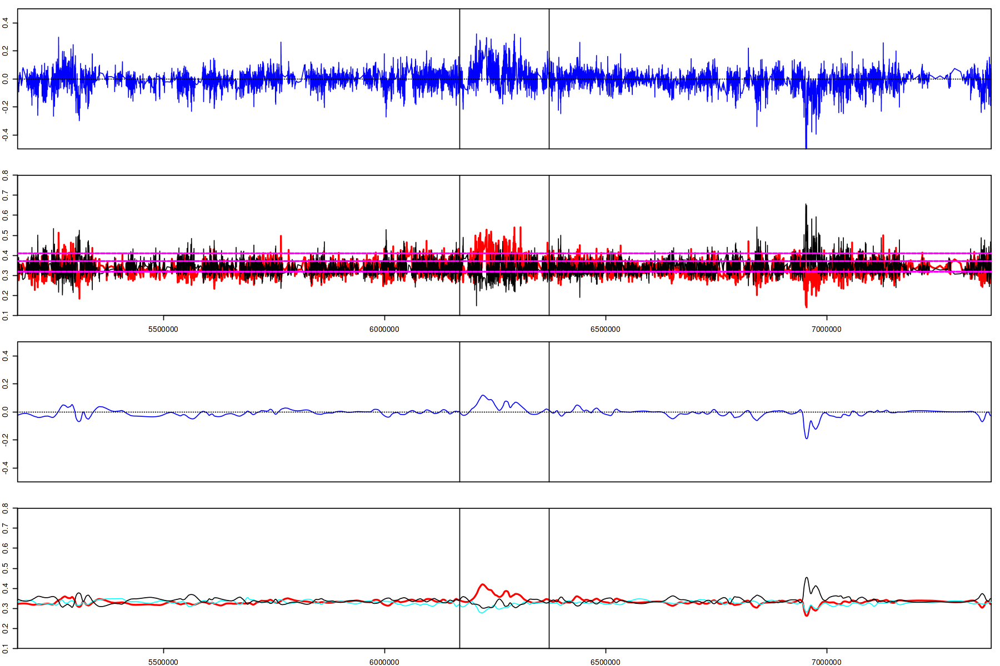

In [95]:
options(repr.plot.height=10, repr.plot.width=15)

# layout(matrix(1:4, ncol=1), heights = c(1, 1, 1, 1))
par(mfrow=c(4,1), xaxs='i', yaxs='i', mar=c(2,2,1,1), cex.axis=1)

dat = chr5
colorGene = rubia
xLimit = c(colorGene[1]-1000000, colorGene[2]+1000000)

## Raw
plot(dat$mid, dat$wt2-dat$wt1, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt1~mid, dat, type='l', lwd=1)
abline(h = quantile(dat$wt2, probs = c(0.99)), col='magenta', lwd=2, lty='longdash')
abline(h = quantile(dat$wt2, probs = c(0.95)), col='magenta', lwd=2, lty='longdash')
abline(h = median(dat$wt2), col='magenta', lwd=2, lty='longdash')
abline(v=colorGene)


## Smooth
plot(dat$mid, dat$wt2.smooth-dat$wt1.smooth, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2.smooth~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt3.smooth~mid, dat, type='l', lwd=1, col='cyan')
lines(wt1.smooth~mid, dat, type='l', lwd=1)
abline(v=colorGene)

### ROSEL

In [117]:
wt_rosel = chr6[start<=rosel[2] & end>=rosel[1]]
fwrite(wt_rosel, file='./weights/geneRosel.chr6.weights.tsv', sep='\t', row.names=F, quote=F)

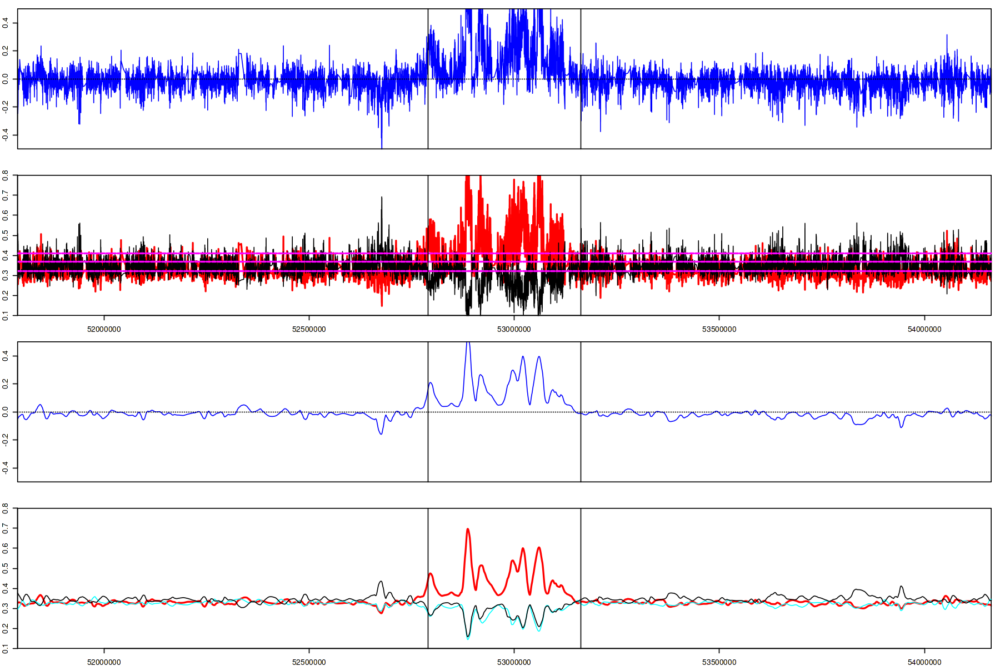

In [96]:
options(repr.plot.height=10, repr.plot.width=15)

# layout(matrix(1:4, ncol=1), heights = c(1, 1, 1, 1))
par(mfrow=c(4,1), xaxs='i', yaxs='i', mar=c(2,2,1,1), cex.axis=1)

dat = chr6
colorGene = rosel
xLimit = c(colorGene[1]-1000000, colorGene[2]+1000000)

## Raw
plot(dat$mid, dat$wt2-dat$wt1, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt1~mid, dat, type='l', lwd=1)
abline(h = quantile(dat$wt2, probs = c(0.99)), col='magenta', lwd=2, lty='longdash')
abline(h = quantile(dat$wt2, probs = c(0.95)), col='magenta', lwd=2, lty='longdash')
abline(h = median(dat$wt2), col='magenta', lwd=2, lty='longdash')
abline(v=colorGene)


## Smooth
plot(dat$mid, dat$wt2.smooth-dat$wt1.smooth, xlim=xLimit, ylim=c(-0.5,0.5), type='l', xaxt='n', col='blue')
abline(h=0, lty=3)
abline(v=colorGene)

plot(wt2.smooth~mid, dat, xlim=xLimit,  ylim=c(0.1,0.8), type='l', col='red', lwd=2)
lines(wt3.smooth~mid, dat, type='l', lwd=1, col='cyan')
lines(wt1.smooth~mid, dat, type='l', lwd=1)
abline(v=colorGene)

## Topo weights vs. recombination Rate

In [50]:
#### Functions ####

## -----
read_recRate_allWindows = function(chrom, pop, no_of_windows, windowSize, bufferSize){
    # chrom = 'Chr2'
    # pop = 'AveM'
    
    fullDat = data.table()

    for(windowID in c(1:no_of_windows)){
        # cat(windowID,'\n')
        recRateFile = Sys.glob(file.path('~/snap_hap_repHZ/recRate_bySnps', chrom, pop, 'windows', 
                                 paste0('*.win',windowID,'.*.*.bpen5.res.txt'))
                              )
        dat = fread(recRateFile)
        
        ## Remove buffer SNPs
        if (windowID == 1){
            dat = dat[1:windowSize,]
        } else if (windowID == no_of_windows){
            dat = dat[(1+bufferSize):nrow(dat),]
        } else {
            dat = dat[(1+bufferSize):(windowSize+bufferSize),]
        }
        dat[, Loci := Loci*1e3]
        # dat[,  := Loci*1e3]
        
        fullDat = rbind(fullDat, dat)
    }
    fullDat$chrom = rep(chrom, nrow(fullDat))
    return(fullDat)
}

## -----
get_mean_rho = function(pop1, pop2, pop3, pop4){
    RhoData = data.table(chrom = pop1$chrom,
                         pos = pop1$Loci, 
                         PlaM = pop1$Mean_rho, 
                         PlaY = pop2$Mean_rho, 
                         AveM = pop3$Mean_rho, 
                         AveY = pop4$Mean_rho
                        )
    RhoData = RhoData %>% mutate(meanRho = (PlaM+PlaY+AveM+AveY)/4)
    RhoData = RhoData[-1,]
    return(RhoData)
}

## -----
get_rho_perTree = function(topoWeights, recRate){
    recRate_perTree = c()
    pb = txtProgressBar(min = 0, max = nrow(topoWeights), style = 3)
    for (posID in 1:nrow(topoWeights)){
        recRate_tmp = recRate[pos>=topoWeights$start[posID] & pos<=topoWeights$end[posID]]
        recRate_perTree = c(recRate_perTree, mean(recRate_tmp$meanRho, na.rm=T))
        setTxtProgressBar(pb, posID)
    }
    close(pb)
    return(recRate_perTree)
}

In [7]:
## Chr1
PlaM = read_recRate_allWindows('Chr1', 'PlaM', no_of_windows=803, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr1', 'PlaY', no_of_windows=803, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr1', 'AveM', no_of_windows=803, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr1', 'AveY', no_of_windows=803, windowSize=2000, bufferSize=100)
recRate_chr1 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr1_perTree = get_rho_perTree(chr1, recRate_chr1)
chr1$recRate = rho_chr1_perTree
chr1$span = chr1$end - chr1$start
chr1 = chr1[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]

str(chr1)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	694286 obs. of  15 variables:
 $ topo1     : int  3455 3391 3287 3295 3312 3269 3274 3459 3541 3501 ...
 $ topo2     : int  3349 3390 3474 3567 3573 3598 3455 3212 3175 3076 ...
 $ topo3     : int  3196 3219 3239 3138 3115 3133 3271 3329 3284 3423 ...
 $ start     : int  4912 5270 5655 6024 6065 6178 6218 6264 6294 6320 ...
 $ end       : int  5269 5654 6023 6064 6177 6217 6263 6293 6319 6379 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ wt1       : num  0.345 0.339 0.329 0.33 0.331 ...
 $ wt2       : num  0.335 0.339 0.347 0.357 0.357 ...
 $ wt3       : num  0.32 0.322 0.324 0.314 0.311 ...
 $ mid       : num  5090 5462 5839 6044 6121 ...
 $ sites     : int  7 5 1 3 2 1 1 1 1 5 ...
 $ wt1.smooth: num  0.349 0.349 0.349 0.349 0.349 ...
 $ wt2.smooth: num  0.323 0.323 0.323 0.323 0.323 ...
 $ wt3.smooth: num  0.328 0.328 0.32

In [39]:
# fwrite(chr1, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr1.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [51]:
## Chr2
PlaM = read_recRate_allWindows('Chr2', 'PlaM', no_of_windows=893, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr2', 'PlaY', no_of_windows=893, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr2', 'AveM', no_of_windows=893, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr2', 'AveY', no_of_windows=893, windowSize=2000, bufferSize=100)
recRate_chr2 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr2_perTree = get_rho_perTree(chr2, recRate_chr2)
chr2$recRate = rho_chr2_perTree
chr2$span = chr2$end - chr2$start
chr2 = chr2[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
str(chr2)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	755313 obs. of  16 variables:
 $ start     : int  3042 3183 3223 3234 3321 6199 6308 6729 6835 6849 ...
 $ end       : int  3182 3222 3233 3320 6198 6307 6728 6834 6848 6962 ...
 $ mid       : num  3112 3202 3228 3277 4760 ...
 $ span      : int  140 39 10 86 2877 108 420 105 13 113 ...
 $ sites     : int  6 2 1 1 1 1 2 2 1 1 ...
 $ recRate   : num  29 34.5 34.6 34.6 34.6 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3253 3319 3250 3112 2956 3331 3360 3587 3475 3510 ...
 $ topo2     : int  3182 3291 3314 3417 3390 3407 3338 3188 3150 3174 ...
 $ topo3     : int  3565 3390 3436 3471 3654 3262 3302 3225 3375 3316 ...
 $ wt1       : num  0.325 0.332 0.325 0.311 0.296 ...
 $ wt2       : num  0.318 0.329 0.331 0.342 0.339 ...
 $ wt3       : num  0.356 0.339 0.344 0.347 0.365 ...
 $ wt1.smooth: num  0.33 0.33 0.33

In [53]:
# fwrite(chr2, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr2.weights.rec.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [17]:
## Chr3
PlaM = read_recRate_allWindows('Chr3', 'PlaM', no_of_windows=710, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr3', 'PlaY', no_of_windows=710, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr3', 'AveM', no_of_windows=710, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr3', 'AveY', no_of_windows=710, windowSize=2000, bufferSize=100)
recRate_chr3 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr3_perTree = get_rho_perTree(chr3, recRate_chr3)
chr3$recRate = rho_chr3_perTree
chr3$span = chr3$end - chr3$start
chr3 = chr3[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
str(chr3)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	601589 obs. of  16 variables:
 $ start     : int  27657 27703 27715 27729 27750 27756 27802 27807 27811 27827 ...
 $ end       : int  27702 27714 27728 27749 27755 27801 27806 27810 27826 27827 ...
 $ mid       : num  27680 27708 27722 27739 27752 ...
 $ span      : int  45 11 13 20 5 45 4 3 15 0 ...
 $ sites     : int  7 2 1 2 2 3 2 1 3 1 ...
 $ recRate   : num  11.4 41.8 75.5 111.9 119.2 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3260 3299 3407 3250 3174 3307 3262 3355 3324 3308 ...
 $ topo2     : int  3354 3456 3363 3478 3521 3417 3425 3412 3386 3338 ...
 $ topo3     : int  3386 3245 3230 3272 3305 3276 3313 3233 3290 3354 ...
 $ wt1       : num  0.326 0.33 0.341 0.325 0.317 ...
 $ wt2       : num  0.335 0.346 0.336 0.348 0.352 ...
 $ wt3       : num  0.339 0.325 0.323 0.327 0.331 ...
 $ wt1.smooth: nu

In [23]:
# fwrite(chr3, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr3.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [19]:
## Chr4
PlaM = read_recRate_allWindows('Chr4', 'PlaM', no_of_windows=592, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr4', 'PlaY', no_of_windows=592, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr4', 'AveM', no_of_windows=592, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr4', 'AveY', no_of_windows=592, windowSize=2000, bufferSize=100)
recRate_chr4 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr4_perTree = get_rho_perTree(chr4, recRate_chr4)
chr4$recRate = rho_chr4_perTree
chr4$span = chr4$end - chr4$start
chr4 = chr4[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
str(chr4)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	519763 obs. of  16 variables:
 $ start     : int  1539 1571 1582 1602 1678 1680 1686 1778 1859 2112 ...
 $ end       : int  1570 1581 1601 1677 1679 1685 1777 1858 2111 2145 ...
 $ mid       : num  1554 1576 1592 1640 1678 ...
 $ span      : int  31 10 19 75 1 5 91 80 252 33 ...
 $ sites     : int  3 3 6 8 1 3 4 7 2 4 ...
 $ recRate   : num  25.3 25.3 25.3 27.1 39.4 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3461 3459 3401 3525 4018 3829 3606 3613 3795 3914 ...
 $ topo2     : int  3233 3217 3295 3241 2965 3059 3102 3189 3147 2994 ...
 $ topo3     : int  3306 3324 3304 3234 3017 3112 3292 3198 3058 3092 ...
 $ wt1       : num  0.346 0.346 0.34 0.352 0.402 ...
 $ wt2       : num  0.323 0.322 0.33 0.324 0.296 ...
 $ wt3       : num  0.331 0.332 0.33 0.323 0.302 ...
 $ wt1.smooth: num  0.36 0.36 0.36 0.36 0.3

In [24]:
# fwrite(chr4, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr4.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [21]:
## Chr5
PlaM = read_recRate_allWindows('Chr5', 'PlaM', no_of_windows=862, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr5', 'PlaY', no_of_windows=862, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr5', 'AveM', no_of_windows=862, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr5', 'AveY', no_of_windows=862, windowSize=2000, bufferSize=100)
recRate_chr5 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr5_perTree = get_rho_perTree(chr5, recRate_chr5)
chr5$recRate = rho_chr5_perTree
chr5$span = chr5$end - chr5$start
chr5 = chr5[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
str(chr5)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	743650 obs. of  16 variables:
 $ start     : int  4770 4772 4786 4901 5022 5039 5040 5462 5536 5541 ...
 $ end       : int  4771 4785 4900 5021 5038 5039 5461 5535 5540 5609 ...
 $ mid       : num  4770 4778 4843 4961 5030 ...
 $ span      : int  1 13 114 120 16 0 421 73 4 68 ...
 $ sites     : int  1 1 4 2 2 1 4 1 1 2 ...
 $ recRate   : num  37.9 38.2 38.8 39.1 39.2 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3468 3355 3282 3277 3227 3297 3508 3343 3578 3655 ...
 $ topo2     : int  3320 3402 3443 3362 3529 3390 3274 3442 3378 3254 ...
 $ topo3     : int  3212 3243 3275 3361 3244 3313 3218 3215 3044 3091 ...
 $ wt1       : num  0.347 0.336 0.328 0.328 0.323 ...
 $ wt2       : num  0.332 0.34 0.344 0.336 0.353 ...
 $ wt3       : num  0.321 0.324 0.328 0.336 0.324 ...
 $ wt1.smooth: num  0.338 0.338 0.337 0.

In [25]:
# fwrite(chr5, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr5.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [26]:
## Chr6
PlaM = read_recRate_allWindows('Chr6', 'PlaM', no_of_windows=626, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr6', 'PlaY', no_of_windows=626, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr6', 'AveM', no_of_windows=626, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr6', 'AveY', no_of_windows=626, windowSize=2000, bufferSize=100)
recRate_chr6 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr6_perTree = get_rho_perTree(chr6, recRate_chr6)
chr6$recRate = rho_chr6_perTree
chr6$span = chr6$end - chr6$start
chr6 = chr6[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
str(chr6)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	550068 obs. of  16 variables:
 $ start     : int  11407 11563 11600 11638 12892 12919 13172 13323 13402 13432 ...
 $ end       : int  11562 11599 11637 12891 12918 13171 13322 13401 13431 13478 ...
 $ mid       : num  11484 11581 11618 12264 12905 ...
 $ span      : int  155 36 37 1253 26 252 150 78 29 46 ...
 $ sites     : int  1 2 1 1 1 2 1 1 1 1 ...
 $ recRate   : num  26.7 27 27.3 27.4 27.4 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3243 3120 3251 3592 3585 3499 3405 2722 3111 3253 ...
 $ topo2     : int  3667 4466 3978 3467 3673 3700 3899 4667 3926 3836 ...
 $ topo3     : int  3090 2414 2771 2941 2742 2801 2696 2611 2963 2911 ...
 $ wt1       : num  0.324 0.312 0.325 0.359 0.358 ...
 $ wt2       : num  0.367 0.447 0.398 0.347 0.367 ...
 $ wt3       : num  0.309 0.241 0.277 0.294 0.274 ...
 $ wt1.smoo

In [27]:
fwrite(chr6, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr6.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [28]:
## Chr7
PlaM = read_recRate_allWindows('Chr7', 'PlaM', no_of_windows=596, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr7', 'PlaY', no_of_windows=596, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr7', 'AveM', no_of_windows=596, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr7', 'AveY', no_of_windows=596, windowSize=2000, bufferSize=100)
recRate_chr7 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr7_perTree = get_rho_perTree(chr7, recRate_chr7)
chr7$recRate = rho_chr7_perTree
chr7$span = chr7$end - chr7$start
chr7 = chr7[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
str(chr7)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	550068 obs. of  16 variables:
 $ start     : int  11407 11563 11600 11638 12892 12919 13172 13323 13402 13432 ...
 $ end       : int  11562 11599 11637 12891 12918 13171 13322 13401 13431 13478 ...
 $ mid       : num  11484 11581 11618 12264 12905 ...
 $ span      : int  155 36 37 1253 26 252 150 78 29 46 ...
 $ sites     : int  1 2 1 1 1 2 1 1 1 1 ...
 $ recRate   : num  26.7 27 27.3 27.4 27.4 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3243 3120 3251 3592 3585 3499 3405 2722 3111 3253 ...
 $ topo2     : int  3667 4466 3978 3467 3673 3700 3899 4667 3926 3836 ...
 $ topo3     : int  3090 2414 2771 2941 2742 2801 2696 2611 2963 2911 ...
 $ wt1       : num  0.324 0.312 0.325 0.359 0.358 ...
 $ wt2       : num  0.367 0.447 0.398 0.347 0.367 ...
 $ wt3       : num  0.309 0.241 0.277 0.294 0.274 ...
 $ wt1.smoo

In [29]:
fwrite(chr7, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr7.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

In [11]:
## Chr8
PlaM = read_recRate_allWindows('Chr8', 'PlaM', no_of_windows=690, windowSize=2000, bufferSize=100)
PlaY = read_recRate_allWindows('Chr8', 'PlaY', no_of_windows=690, windowSize=2000, bufferSize=100)
AveM = read_recRate_allWindows('Chr8', 'AveM', no_of_windows=690, windowSize=2000, bufferSize=100)
AveY = read_recRate_allWindows('Chr8', 'AveY', no_of_windows=690, windowSize=2000, bufferSize=100)
recRate_chr8 = get_mean_rho(PlaM, PlaY, AveM, AveY)

rho_chr8_perTree = get_rho_perTree(chr8, recRate_chr8)
chr8$recRate = rho_chr8_perTree
chr8$span = chr8$end - chr8$start
chr8 = chr8[, c('start', 'end', 'mid', 'span', 'sites', 'recRate',
                        'total', 'topo1', 'topo2', 'topo3', 
                        'wt1', 'wt2', 'wt3', 
                        'wt1.smooth', 'wt2.smooth', 'wt3.smooth')]
str(chr8)

  |======================================================================| 100%
Classes ‘data.table’ and 'data.frame':	592222 obs. of  16 variables:
 $ start     : int  6127 6274 6304 6382 6418 6479 6541 6653 6671 6686 ...
 $ end       : int  6273 6303 6381 6417 6478 6540 6652 6670 6685 6706 ...
 $ mid       : num  6200 6288 6342 6400 6448 ...
 $ span      : int  146 29 77 35 60 61 111 17 14 20 ...
 $ sites     : int  2 1 2 1 1 4 2 1 1 1 ...
 $ recRate   : num  31.3 31.3 31.3 31.3 31.3 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3245 3480 3355 3389 3521 3466 3406 3377 3459 3345 ...
 $ topo2     : int  3381 3249 3371 3291 3254 3361 3301 3356 3208 3266 ...
 $ topo3     : int  3374 3271 3274 3320 3225 3173 3293 3267 3333 3389 ...
 $ wt1       : num  0.325 0.348 0.336 0.339 0.352 ...
 $ wt2       : num  0.338 0.325 0.337 0.329 0.325 ...
 $ wt3       : num  0.337 0.327 0.327 0.332 0.323 ...
 $ wt1.smooth: num  0.333 0.333 0.333

In [13]:
fwrite(chr8, file='~/snap_hap_repHZ/twisst/trees_relate/weights/chr8.weights.smooth.csv.gz', quote=F, row.names=F, col.names=T)

### Plot and correlation bw topo wt vs. recRate

In [40]:
str(allchrom)

Classes ‘data.table’ and 'data.frame':	4975454 obs. of  18 variables:
 $ chrom     : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ start     : int  4912 5270 5655 6024 6065 6178 6218 6264 6294 6320 ...
 $ end       : int  5269 5654 6023 6064 6177 6217 6263 6293 6319 6379 ...
 $ mid       : num  5090 5462 5839 6044 6121 ...
 $ span      : int  357 384 368 40 112 39 45 29 25 59 ...
 $ sites     : int  7 5 1 3 2 1 1 1 1 5 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  3455 3391 3287 3295 3312 3269 3274 3459 3541 3501 ...
 $ topo2     : int  3349 3390 3474 3567 3573 3598 3455 3212 3175 3076 ...
 $ topo3     : int  3196 3219 3239 3138 3115 3133 3271 3329 3284 3423 ...
 $ wt1       : num  0.345 0.339 0.329 0.33 0.331 ...
 $ wt2       : num  0.335 0.339 0.347 0.357 0.357 ...
 $ wt3       : num  0.32 0.322 0.324 0.314 0.311 ...
 $ wt1.smooth: num  0.349 0.349 0.349 0.349 0.349 ...
 $ wt2.smooth: num  0.323 0.323 0.323 0.323 0.323 ...
 $ wt

In [41]:
cor(allchrom$wt1, allchrom$recRate, method='spearman', use='na.or.complete')
cor(allchrom$wt2, allchrom$recRate, method='spearman', use='na.or.complete')
cor(allchrom$wt3, allchrom$recRate, method='spearman', use='na.or.complete')

ERROR: Error in cor(allchrom$wt1, allchrom$recRate, method = "spearman", use = "na.or.complete"): supply both 'x' and 'y' or a matrix-like 'x'


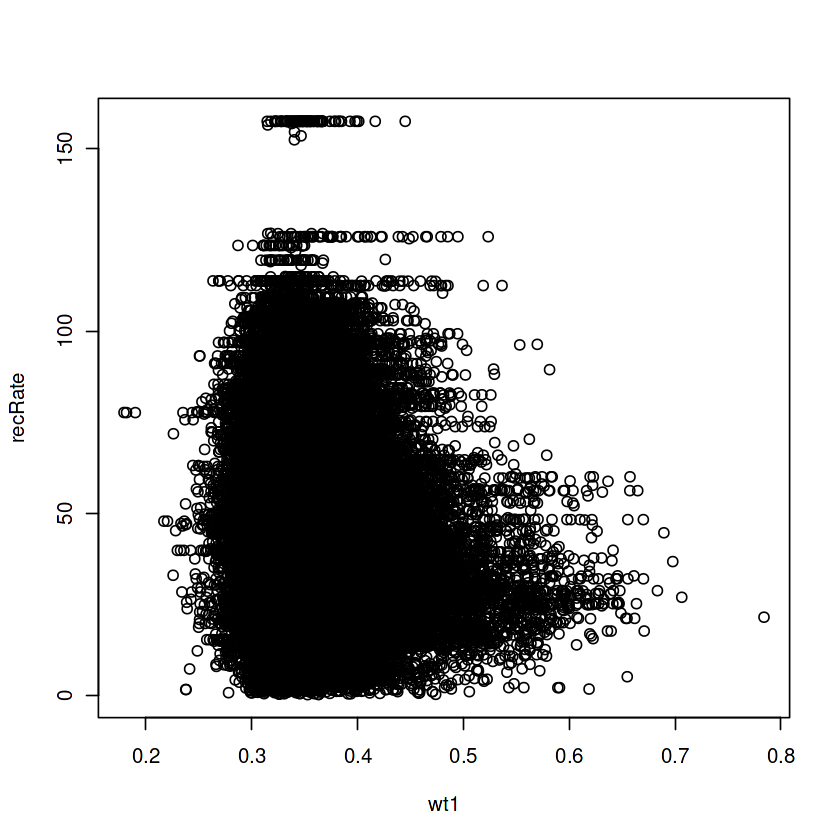

In [23]:
options(repr.plot.width)
plot(recRate~wt1, allchrom[1:100000, ])

Warning message:
“Removed 16227 rows containing non-finite values (`stat_binhex()`).”
Warning message:
“Removed 26 rows containing missing values (`geom_hex()`).”
Warning message:
“Removed 16227 rows containing non-finite values (`stat_binhex()`).”
Warning message:
“Removed 22 rows containing missing values (`geom_hex()`).”
Warning message:
“Removed 16227 rows containing non-finite values (`stat_binhex()`).”
Warning message:
“Removed 20 rows containing missing values (`geom_hex()`).”


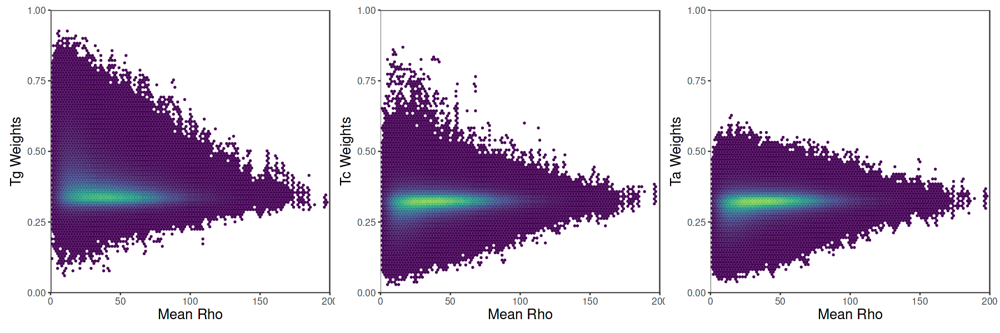

In [51]:
options(repr.plot.width=15, repr.plot.height=5)

colorRange = c(0,24000)
xLimits = c(0,200)
yLimits = c(0,1)
plot_theme <- theme_bw() + theme(panel.grid = element_blank(), 
                                 axis.text = element_text(size=10), 
                                 axis.title = element_text(size=15), 
                                 legend.position='none')

## wt1
data = allchrom; x = 'recRate'; y = 'wt1'
plt_wt1 = ggplot(data, aes(x=.data[[x]], y=.data[[y]])) + 
                geom_hex(bins=100) + 
                scale_x_continuous(limits=xLimits, expand=c(0,0)) + 
                scale_y_continuous(limits=yLimits, expand=c(0,0)) + 
                labs(x = "Mean Rho", y = 'Tg Weights') +
                scale_fill_viridis_c(option='D', limits=colorRange) + 
                # geom_abline(slope = 1, intercept = 0) +
                plot_theme

## wt2
data = allchrom; x = 'recRate'; y = 'wt2'
plt_wt2 = ggplot(data, aes(x=.data[[x]], y=.data[[y]])) + 
                geom_hex(bins=100) + 
                scale_x_continuous(limits=xLimits, expand=c(0,0)) + 
                scale_y_continuous(limits=yLimits, expand=c(0,0)) + 
                labs(x = "Mean Rho", y = 'Tc Weights') +
                scale_fill_viridis_c(option='D', limits=colorRange) + 
                # geom_abline(slope = 1, intercept = 0) +
                plot_theme

## wt3
data = allchrom; x = 'recRate'; y = 'wt3'
plt_wt3 = ggplot(data, aes(x=.data[[x]], y=.data[[y]])) + 
                geom_hex(bins=100) + 
                scale_x_continuous(limits=xLimits, expand=c(0,0)) + 
                scale_y_continuous(limits=yLimits, expand=c(0,0)) +
                labs(x = "Mean Rho", y = 'Ta Weights') +
                scale_fill_viridis_c(option='D', limits=colorRange) + 
                # geom_abline(slope = 1, intercept = 0) +
                plot_theme

plt_wt1 + plt_wt2 + plt_wt3

### Rec Rate around Fla

In [59]:
chr2_fla = chr2[start<=56100000 & end>=51100000]
str(chr2_fla)

Classes ‘data.table’ and 'data.frame':	50410 obs. of  16 variables:
 $ start     : int  51099973 51100004 51100095 51100225 51100269 51100309 51100352 51100360 51100675 51101199 ...
 $ end       : int  51100003 51100094 51100224 51100268 51100308 51100351 51100359 51100674 51101198 51101982 ...
 $ mid       : num  51099988 51100049 51100160 51100246 51100288 ...
 $ span      : int  30 90 129 43 39 42 7 314 523 783 ...
 $ sites     : int  2 2 1 2 2 1 1 1 1 4 ...
 $ recRate   : num  28.6 28.6 28.6 28.5 28.4 ...
 $ total     : int  10000 10000 10000 10000 10000 10000 10000 10000 10000 10000 ...
 $ topo1     : int  2945 2999 2653 2929 2834 2791 2607 2604 3356 3228 ...
 $ topo2     : int  3890 4033 4200 3710 3757 4322 4657 4398 3424 3681 ...
 $ topo3     : int  3165 2968 3147 3361 3409 2887 2736 2998 3220 3091 ...
 $ wt1       : num  0.294 0.3 0.265 0.293 0.283 ...
 $ wt2       : num  0.389 0.403 0.42 0.371 0.376 ...
 $ wt3       : num  0.317 0.297 0.315 0.336 0.341 ...
 $ wt1.smooth: num  

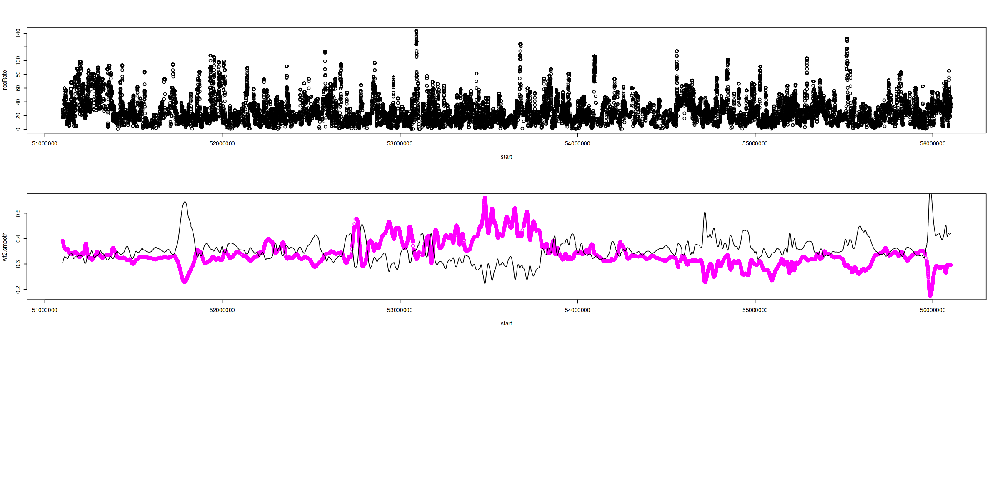

In [64]:
options(repr.plot.width=20, repr.plot.height=10)
par(mfrow=c(3,1))
plot(recRate~start, chr2_fla)
plot(wt2.smooth~start, chr2_fla, col='magenta')
lines(wt1.smooth~start, chr2_fla)

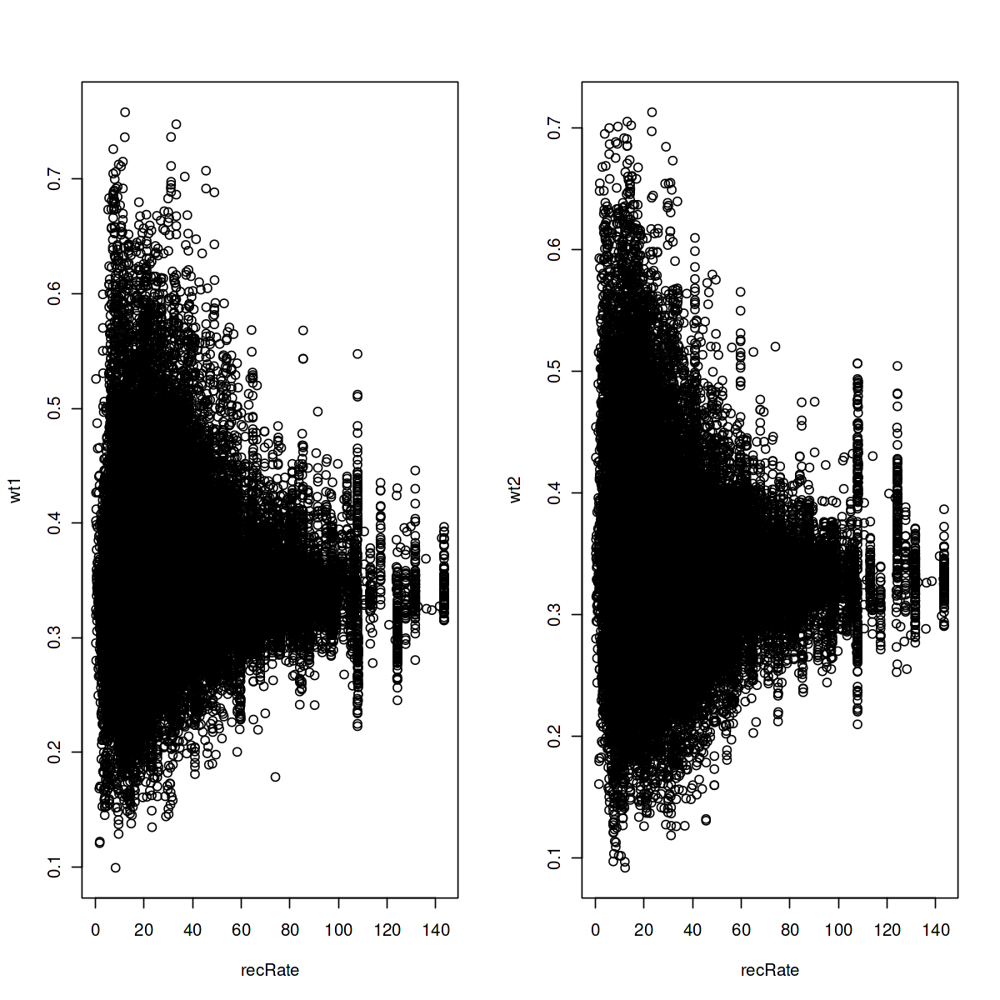

In [66]:
options(repr.plot.width=10, repr.plot.height=10)
par(mfrow=c(1,2))
plot(wt1~recRate, chr2_fla)
plot(wt2~recRate, chr2_fla)